FPS 30

In [ ]:
from tensorflow import keras
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os
from tqdm import tqdm
from glob import glob
from google.colab.patches import cv2_imshow
import scipy.signal as signal

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
videos = pd.read_csv('/content/drive/MyDrive/videodf.csv')
videos.head()
video_name = videos["Video"].tolist()
study_id = videos["Study ID"].tolist()

In [ ]:
def extract_frames(video_path, extract_rate=1):
    cap = cv2.VideoCapture(video_path)
    frames = []
    fps = cap.get(cv2.CAP_PROP_FPS)  # Get the frames per second of the video
    interval = int(fps / extract_rate)  # Calculate the interval at which to extract frames

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        if frame_count % interval == 0:
            frames.append(frame)
        frame_count += 1

    cap.release()
    return frames

In [ ]:
def crop_to_echo(frame, showECG=False):
  # Convert the frame to grayscale
  gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

  # Apply Gaussian blur to reduce noise
  blurred_frame = cv2.GaussianBlur(gray_frame, (1, 1), 0)

  # Use Otsu's thresholding to obtain a binary black-and-white image
  # !!! Main thing to change if not crop correct change 12
  _, binary_frame = cv2.threshold(blurred_frame, 12, 255, cv2.THRESH_BINARY)

  # Dilate the binary image to enhance features
  dilated_frame = cv2.dilate(binary_frame, None, iterations=1)

  # Find contours
  contours, _ = cv2.findContours(dilated_frame, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  # Assuming you want the largest contour (modify as needed)
  largest_contour = max(contours, key=cv2.contourArea)

  # Get bounding rectangle coordinates
  x, y, w, h = cv2.boundingRect(largest_contour)

  # Extract ROI
  roi = frame[y:y+h, x:x+w]

  if showECG:
    contours = sorted(contours, key=cv2.contourArea, reverse=True)
    if len(contours) > 1:
      second_largest_contour = contours[1]
      x, y, w, h = cv2.boundingRect(second_largest_contour)

      # Extract ROI
      ECG = frame[y:y+h, x:x+w]

      return ECG
  else:
    return roi


In [ ]:
# Preprocess the Frame
def preprocess_frame(frame):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (9, 9), 0)  # Increased blur kernel size
    _, thresh = cv2.threshold(blurred, 40, 255, cv2.THRESH_BINARY)  # Adjusted fixed threshold value
    return thresh

def segment_background(frame):
    contours, _ = cv2.findContours(frame, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    min_area = 1000  # Adjusted minimum area threshold
    background_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]
    return background_contours

# Calculate the Area of Non-zero Pixels
def calculate_non_zero_area(frame):
    return np.count_nonzero(frame)

#  Calculate Non-zero Area Over Time and Visualize Contours
def calculate_non_zero_area_over_time(frames, visualize=False):
    areas = []
    for i, frame in enumerate(frames):
        preprocessed = preprocess_frame(frame)
        background_contours = segment_background(preprocessed)
        area = calculate_non_zero_area(preprocessed)
        areas.append(area)

        if visualize and i % 10 == 0:  # Visualize every 10th frame
            # Draw contours on the frame
            frame_with_contours = cv2.drawContours(frame.copy(), background_contours, -1, (0, 255, 0), 2)
            # Draw grid lines
            num_rows, num_cols = frame.shape[:2]
            for row in range(0, num_rows, 50):  # Adjust grid spacing as needed
                cv2.line(frame_with_contours, (0, row), (num_cols - 1, row), (255, 0, 0), 1)
            for col in range(0, num_cols, 50):  # Adjust grid spacing as needed
                cv2.line(frame_with_contours, (col, 0), (col, num_rows - 1), (255, 0, 0), 1)

            # Display the original frame, thresholded image, and frame with contours
            plt.figure(figsize=(18, 6))

            plt.subplot(1, 3, 1)
            plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            plt.title("Original Frame")
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(preprocessed, cmap='gray')
            plt.title("Thresholded Image")
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(cv2.cvtColor(frame_with_contours, cv2.COLOR_BGR2RGB))
            plt.title("Frame with Detected Contours and Grid")
            plt.axis('off')

            plt.show()

    return areas


In [ ]:
# Step 3: Calculate the Area of Non-zero Pixels for Each Quadrant
def calculate_quadrant_areas(frame):
    num_rows, num_cols = frame.shape[:2]
    quadrant_areas = []
    for row_div in range(9):
        for col_div in range(9):
            # Calculate quadrant boundaries
            start_row = row_div * (num_rows // 9)
            end_row = start_row + (num_rows // 9)
            start_col = col_div * (num_cols // 9)
            end_col = start_col + (num_cols // 9)

            # Calculate area in the quadrant
            quadrant_area = np.count_nonzero(frame[start_row:end_row, start_col:end_col])
            quadrant_areas.append(quadrant_area)

    return quadrant_areas

# Step 4: Calculate Quadrant Area Changes Over Time
def calculate_quadrant_area_changes(frames):
    quadrant_area_changes = []
    for frame in frames:
        preprocessed = preprocess_frame(frame)
        quadrant_areas = calculate_quadrant_areas(preprocessed)
        quadrant_area_changes.append(quadrant_areas)

    return quadrant_area_changes

# plt.show()


In [ ]:
def get_quadrant_areas_at_frames(frames, peak_frames, trough_frames):
    peak_quadrant_areas = []
    trough_quadrant_areas = []

    for peak_idx, trough_idx in zip(peak_frames, trough_frames):
        if not np.isnan(peak_idx):
            peak_frame = frames[int(peak_idx)]
            peak_preprocessed_frame = preprocess_frame(peak_frame)
            peak_quadrant_areas.append(calculate_quadrant_areas(peak_preprocessed_frame))
        else:
            peak_quadrant_areas.append([np.nan] * 81)

        if not np.isnan(trough_idx):
            trough_frame = frames[int(trough_idx)]
            trough_preprocessed_frame = preprocess_frame(trough_frame)
            trough_quadrant_areas.append(calculate_quadrant_areas(trough_preprocessed_frame))
        else:
            trough_quadrant_areas.append([np.nan] * 81)

    return peak_quadrant_areas, trough_quadrant_areas



[ 29  53  81 107 133 167 188 220 242 270 294 327]
[ 18  41  71  96 125 152 177 205 234 260 282 313]


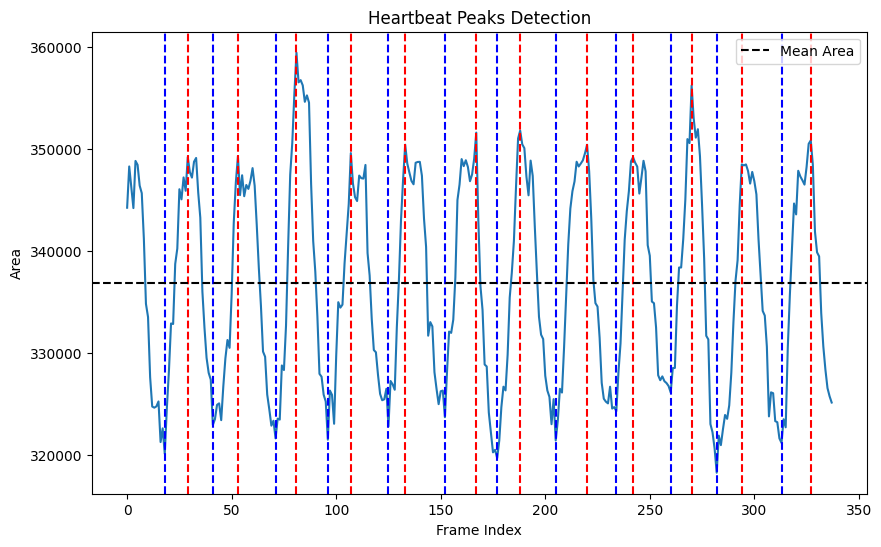

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 20  47  74 101 130 162 184 212 240 266 294 321]
[ 10  37  64  93 121 148 172 203 230 257 280 313]


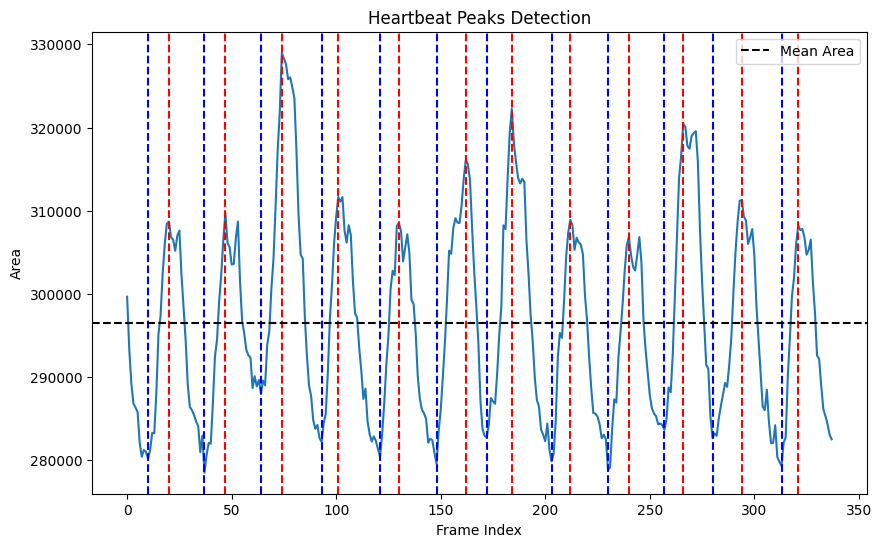

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 30  53  81 108 135 162 193 218 244 276 299 326]
[ 16  39  71  97 121 151 179 202 234 262 284 317]


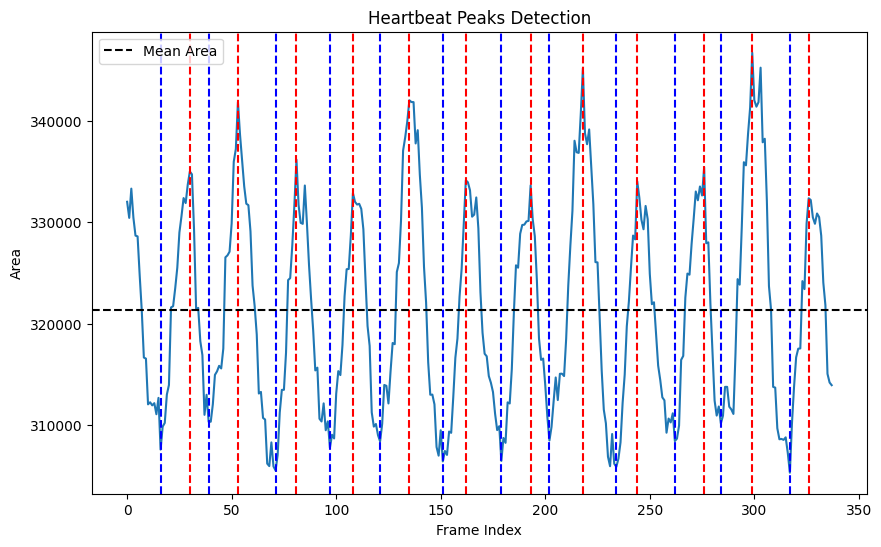

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 25  54  81 112 140 164 194 222 245 276 304 332]
[ 11  42  71  95 125 152 178 208 234 260 285 313]


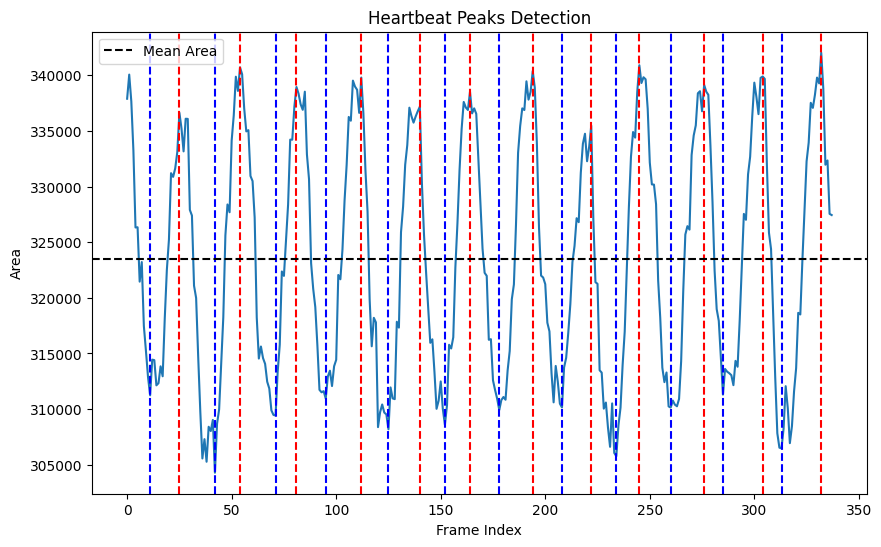

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  6  61  89 115 149 176 196 229 256 282 302 329]
[ 24  52  80 102 131 159 185 208 238 267 293 316]


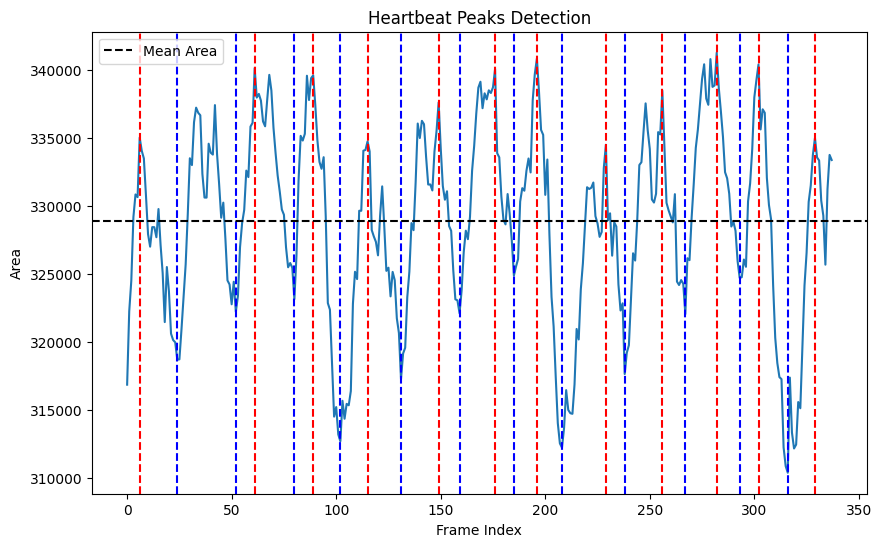

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 16  44  76  99 123 151 183 205 231 257 289 315]
[  9  31  62  87 114 138 169 196 221 244 275 302 328]


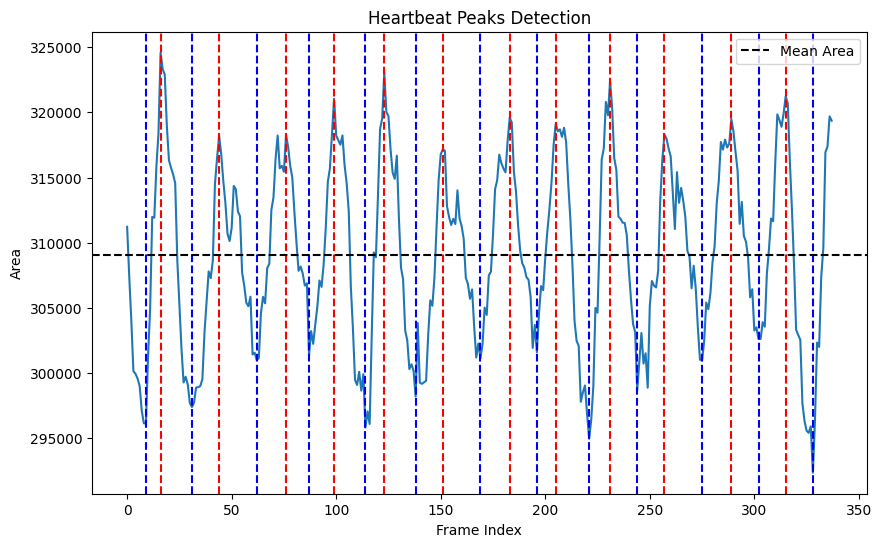

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 16  45  76  99 133 165 193 219 245 281 312]
[ 28  58  85 117 146 177 205 229 265 296 324]


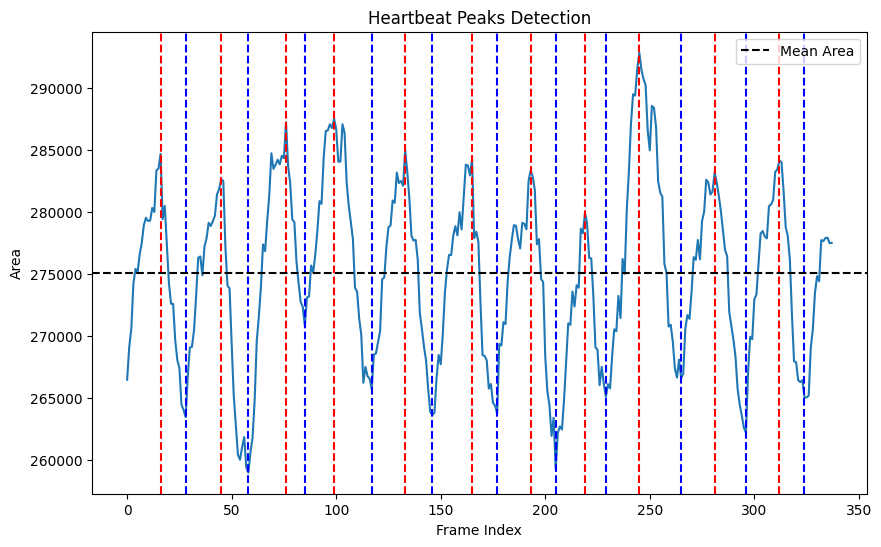

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 30  60  86 123 149 179 211 235 270 300 329]
[ 11  45  71 103 131 165 194 225 246 279 313]


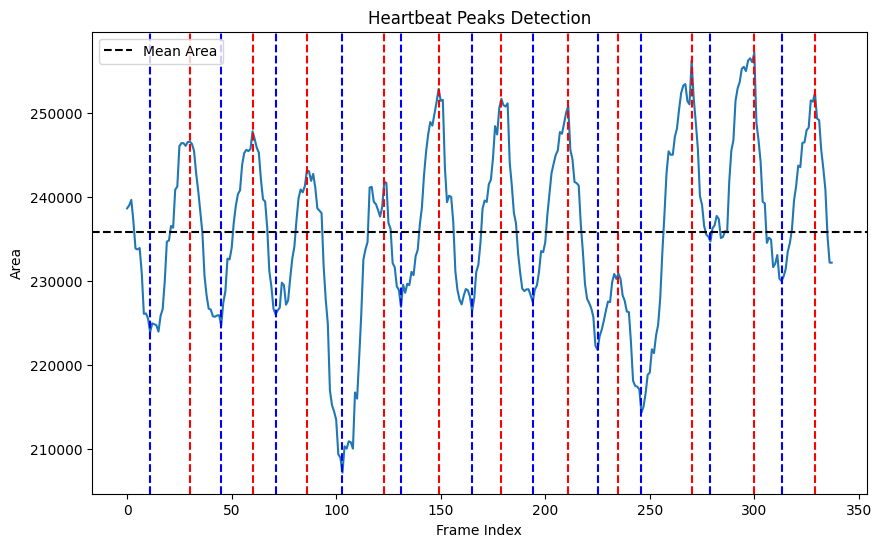

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 27  55  94 126 153 193 226 253 292 325]
[ 11  41  78 111 138 176 211 240 275 310]


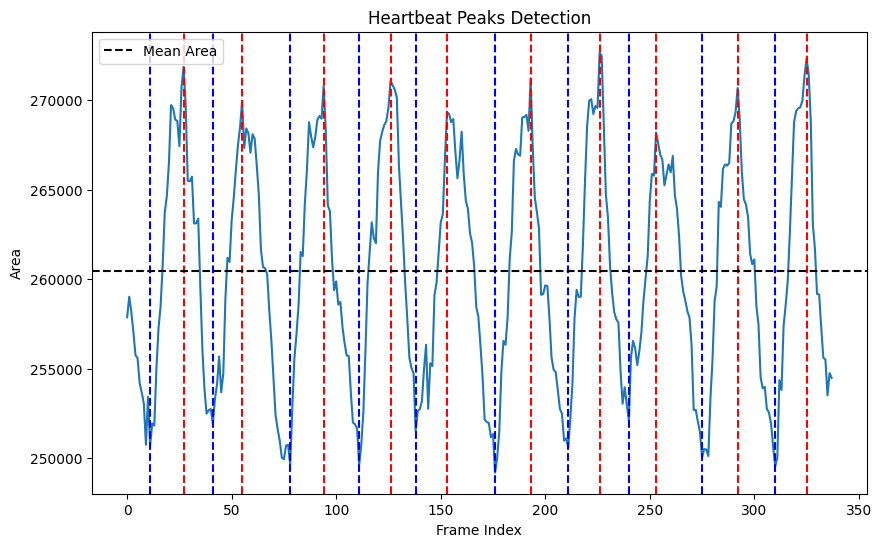

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  4  38  73 105 140 173 206 240 274 307]
[ 22  56  88 125 158 192 225 262 292 326]


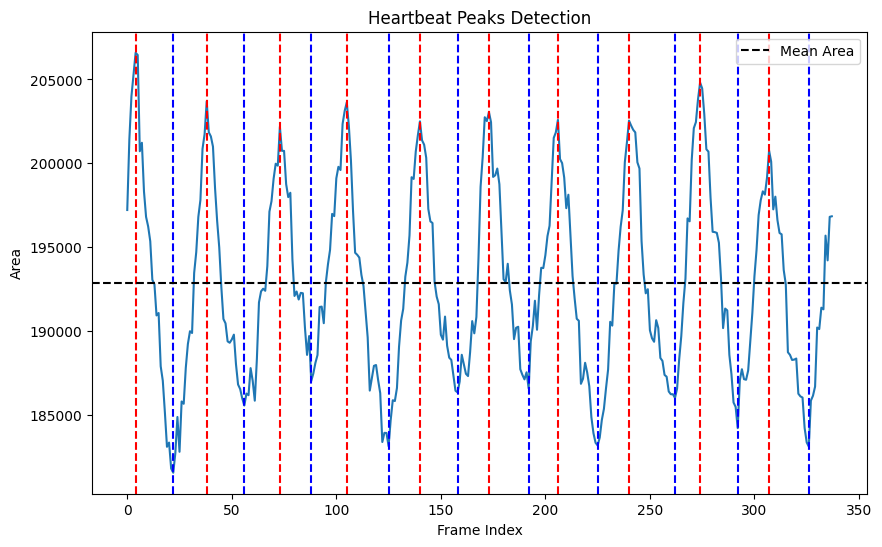

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 24  52  82 112 140 166 197 229 256 285 312]
[  7  38  66  96 126 155 184 210 239 270 300 329]


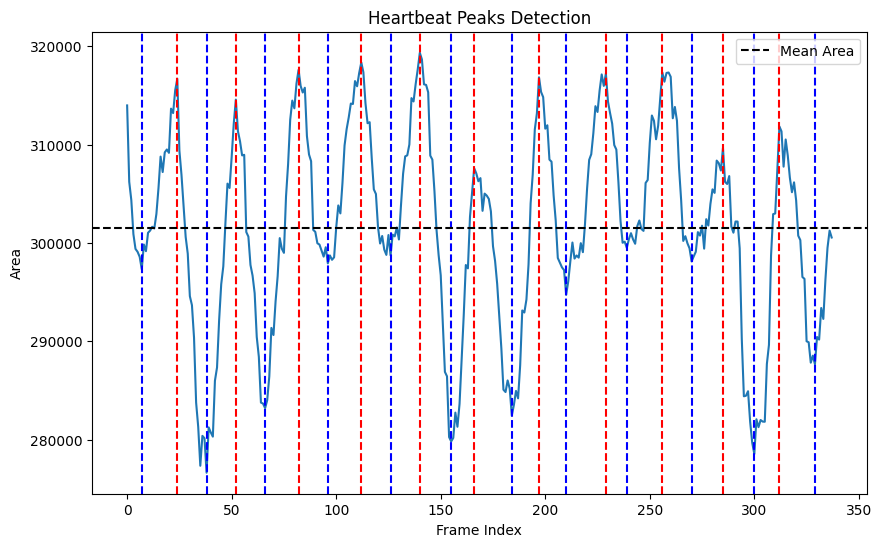

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 20  48  83 105 134 165 193 222 250 280 307]
[  5  34  62  91 121 150 178 206 239 264 297 322]


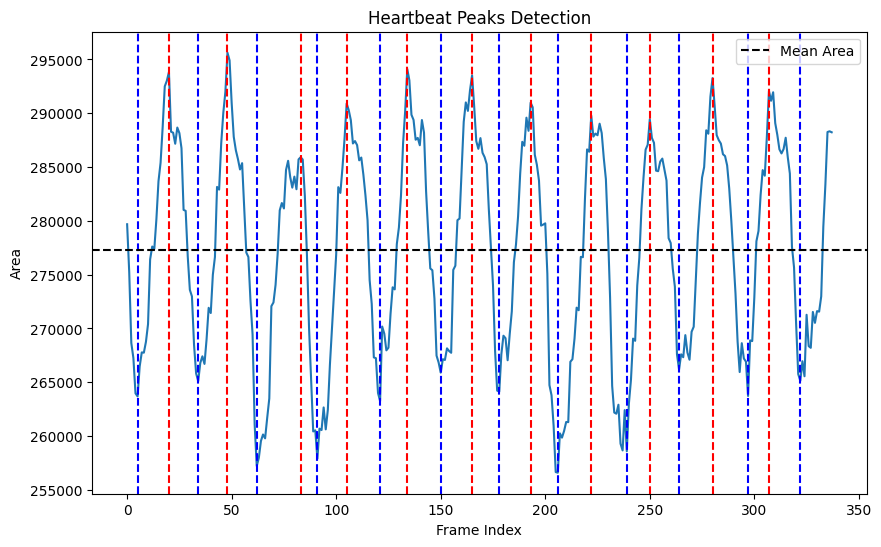

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 19  46  73 101 129 157 185 212 236 267 295 319]
[  3  31  60  87 114 142 169 197 225 253 280 308]


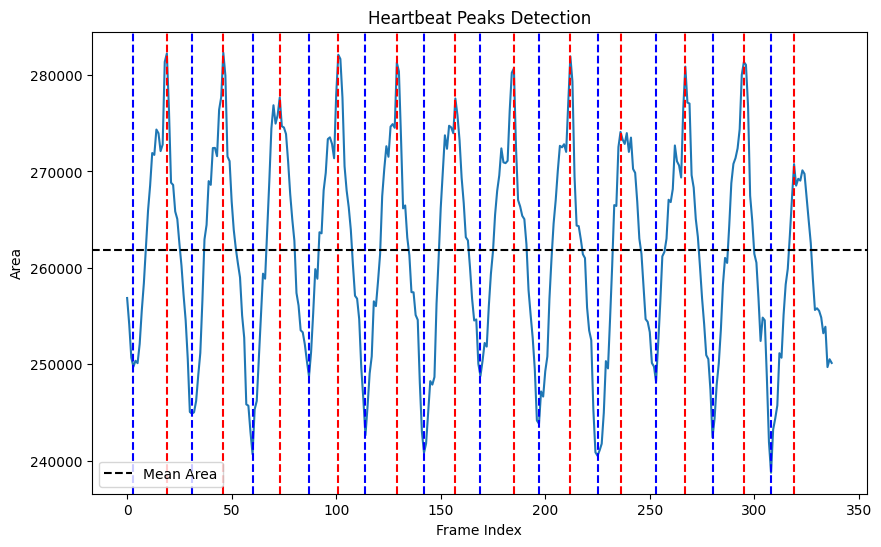

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 17  46  76  99 123 159 183 209 242 266 294 327]
[  2  31  59  88 112 144 170 197 228 255 281 311]


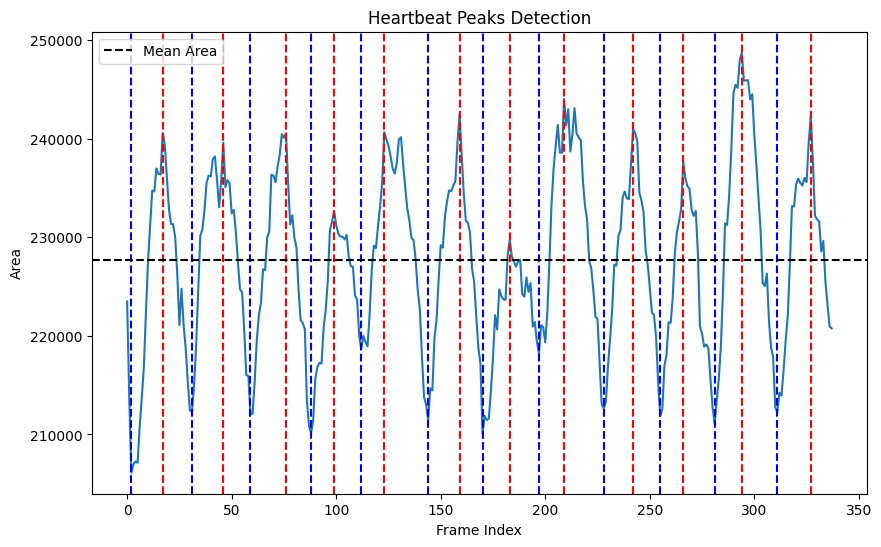

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 11  41  70  96 127 154 185 214 245 274 302 333]
[ 25  51  82 110 139 172 197 230 260 288 317]


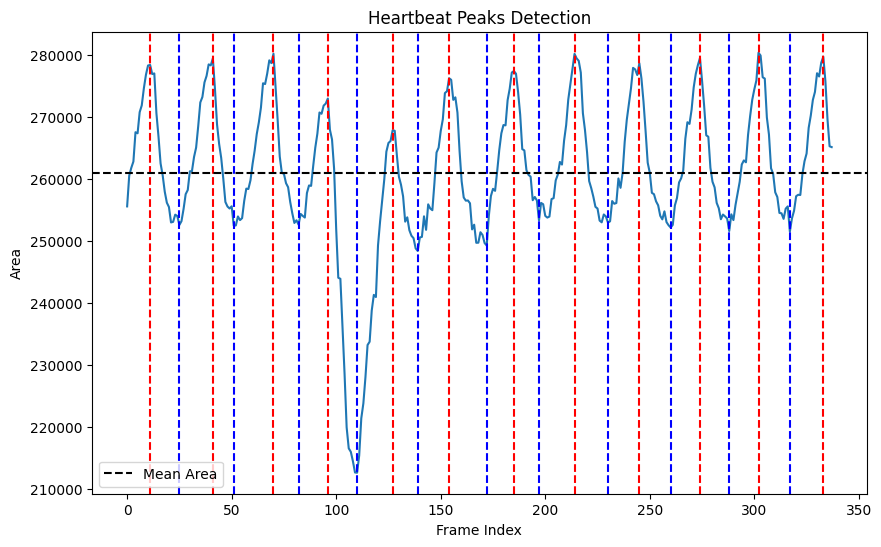

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  9  37  62  95 123 152 182 210 240 268 297 325]
[ 23  51  76 108 137 167 195 225 254 282 310]


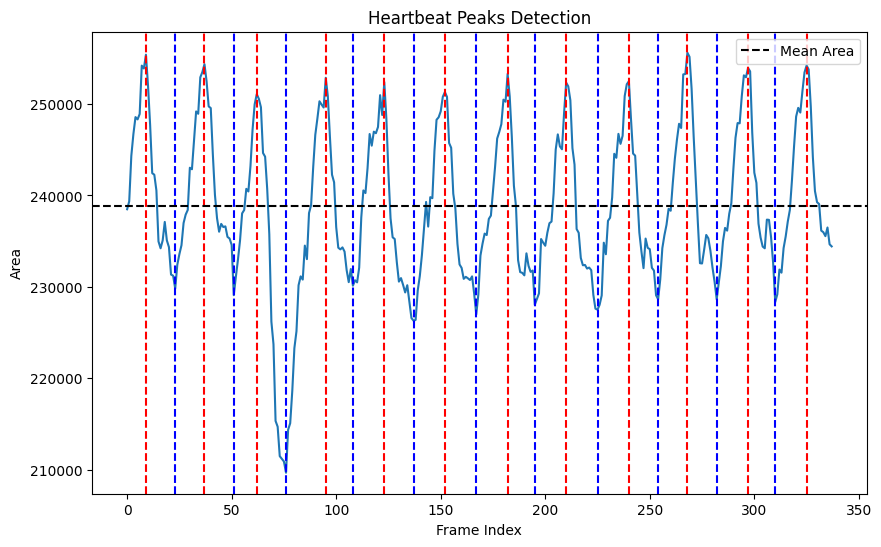

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 18  46  74 103 131 159 187 215 244 273 300 329]
[  5  33  60  93 116 146 174 201 230 258 287 315]


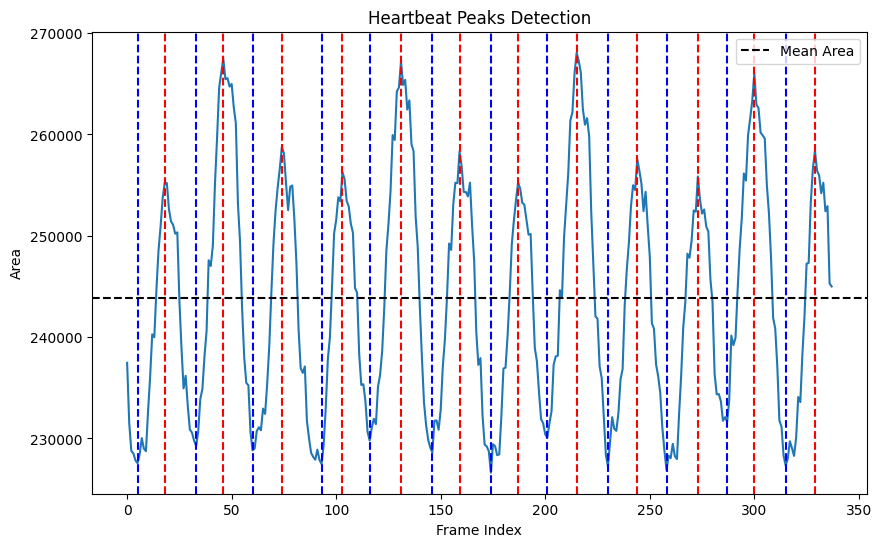

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 11  39  68  97 125 156 184 212 241 270 298 326]
[ 26  58  88 113 143 173 202 230 256 284 317]


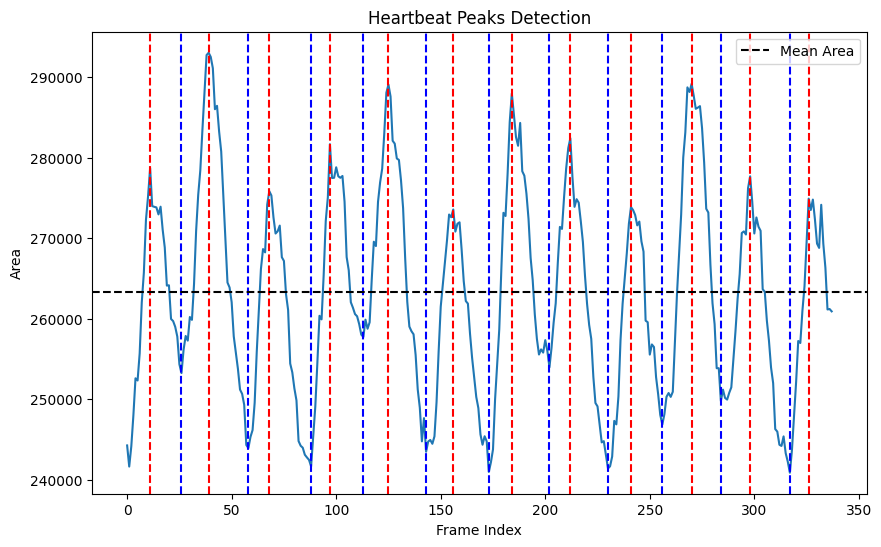

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 11  44  67  99 126 154 176 205 237 259 292 319]
[ 26  58  84 112 134 164 193 221 248 271 303 331]


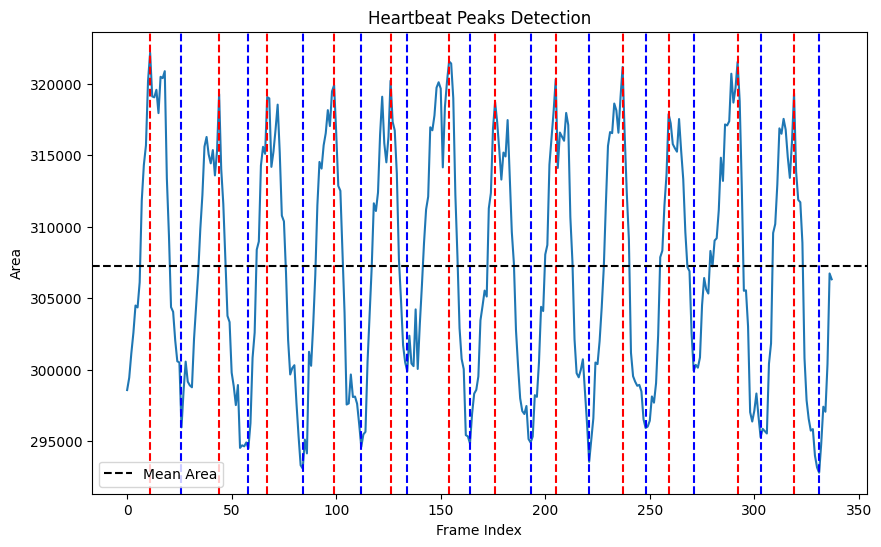

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 12  39  68 100 123 149 177 211 233 266 293 317]
[ 26  55  85 113 140 163 196 225 250 279 305]


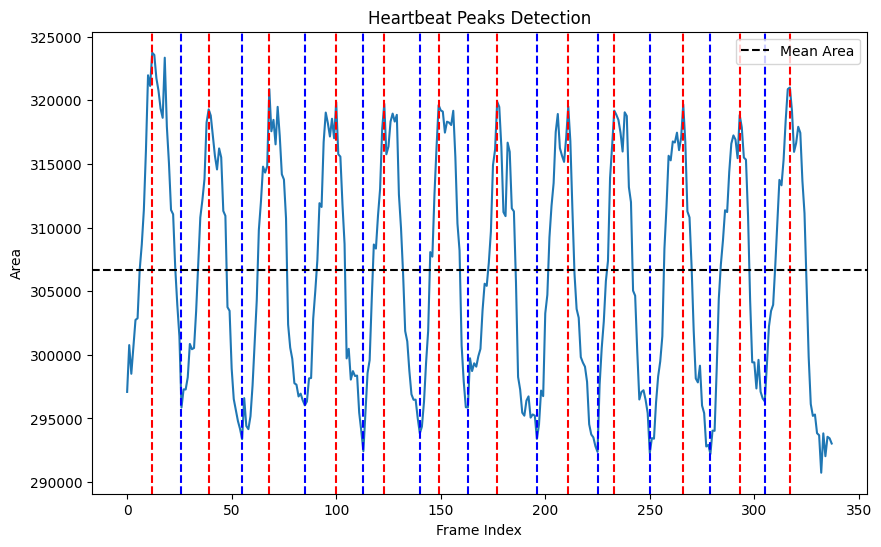

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  4  30  62  91 121 151 179 209 238 267 298 327]
[ 18  51  77 110 137 163 192 226 254 283 315]


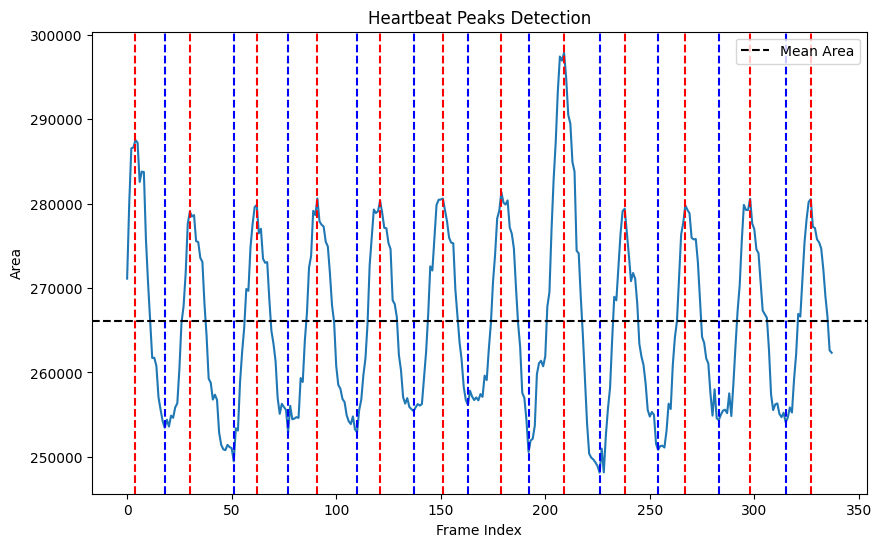

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  2  32  62  91 122 150 179 210 239 270 299 329]
[ 21  50  79 110 139 165 195 228 257 287 314]


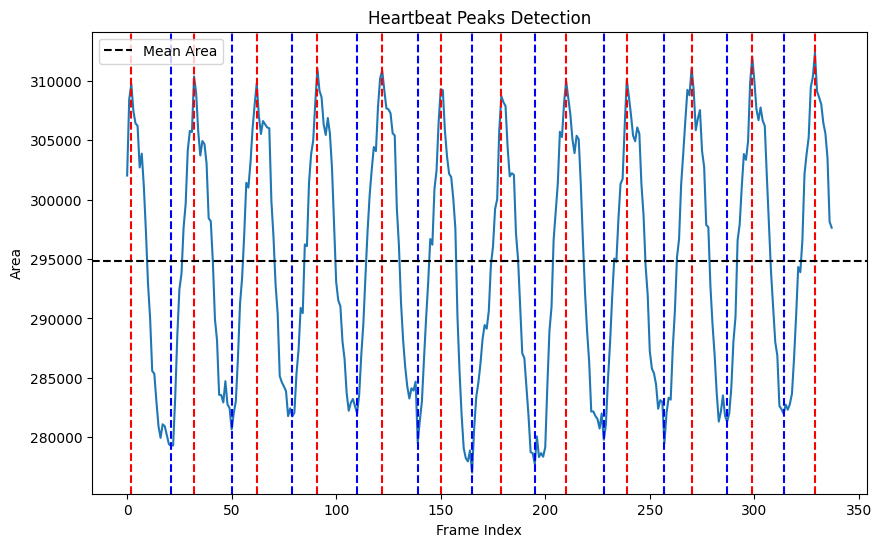

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 12  38  69  89 121 145 173 197 230 254 281 307]
[ 25  49  80 106 133 157 187 214 243 265 297 322]


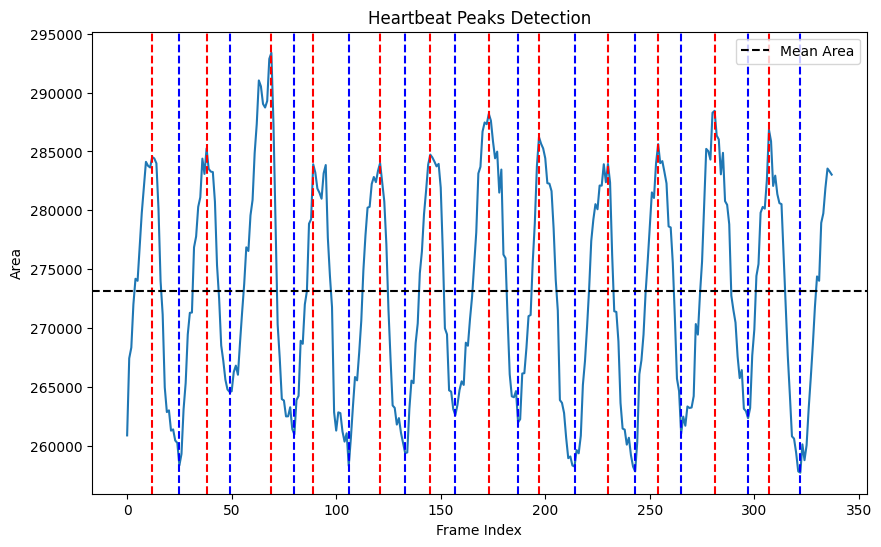

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 19  50  77 103 128 157 186 210 238 266 294 319]
[  1  32  60  88 117 143 168 197 221 253 281 308]


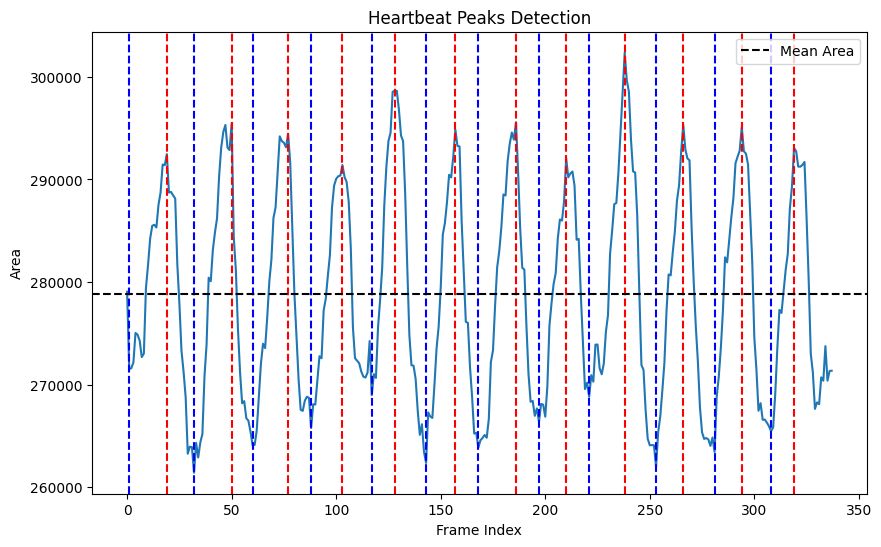

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  6  35  63  89 117 152 179 210 238 267 298 325]
[ 22  51  78 103 137 166 195 225 253 282 310]


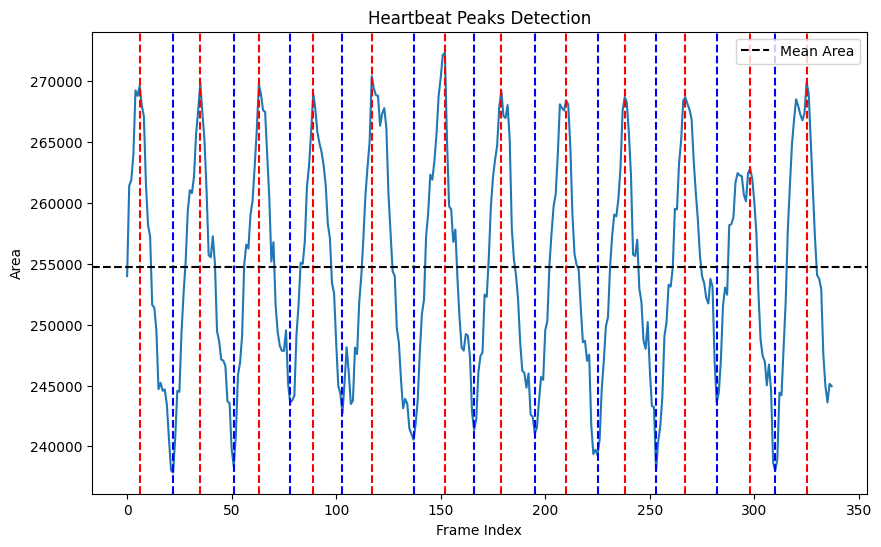

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 12  44  72 100 136 159 187 217 247 274 304]
[ 34  62  93 121 146 178 209 237 267 296 325]


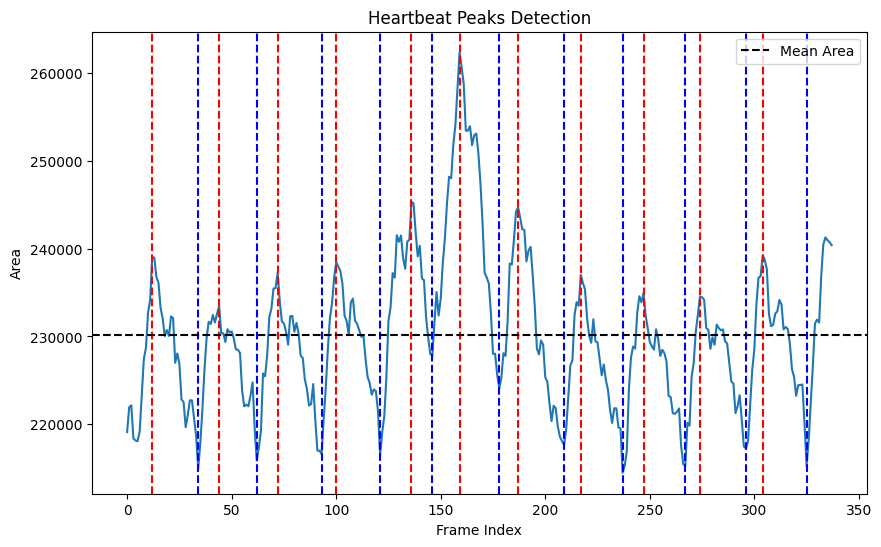

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 28  56  88 116 145 176 206 238 265 298 325]
[ 13  41  70 105 131 166 190 220 250 281 309]


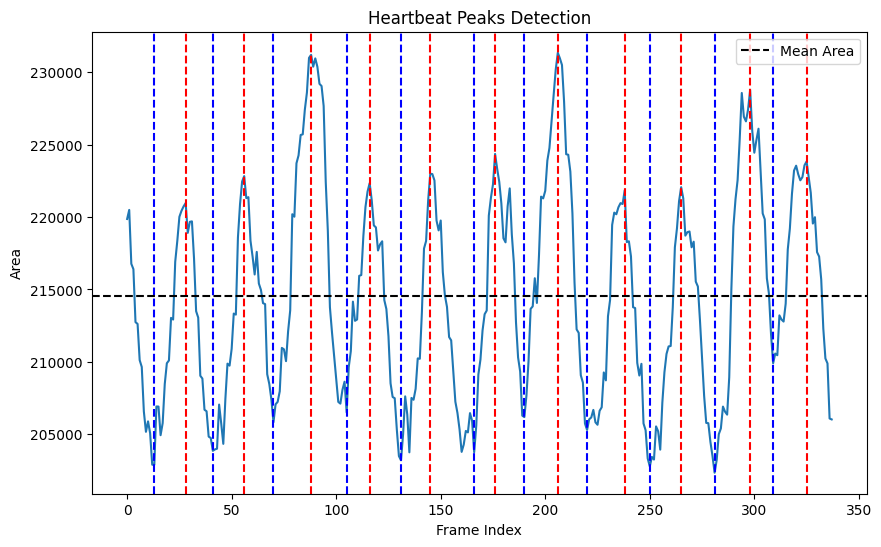

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 24  46  76 114 143 169 198 232 263 288 317]
[  7  36  63  93 128 157 182 216 246 278 301]


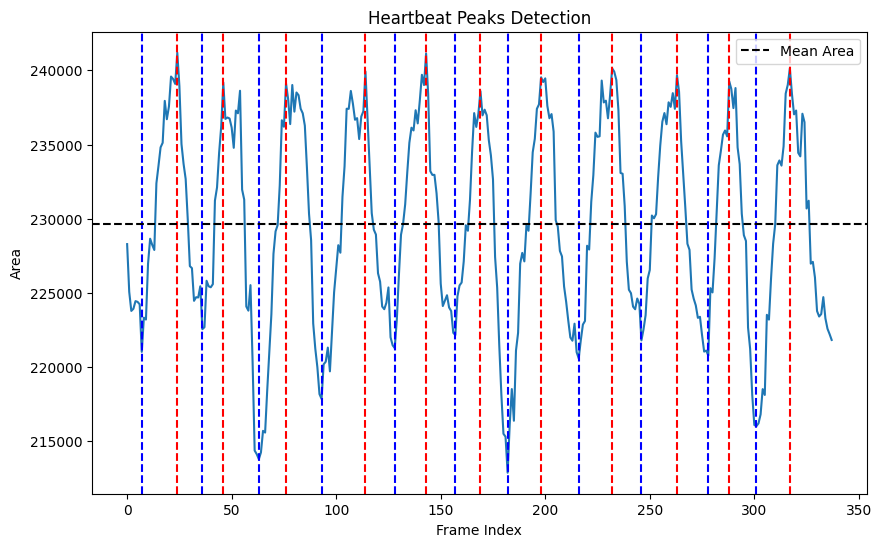

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 14  38  65  94 124 148 180 203 235 258 290 314]
[ 20  52  79 110 134 163 186 218 246 272 301 328]


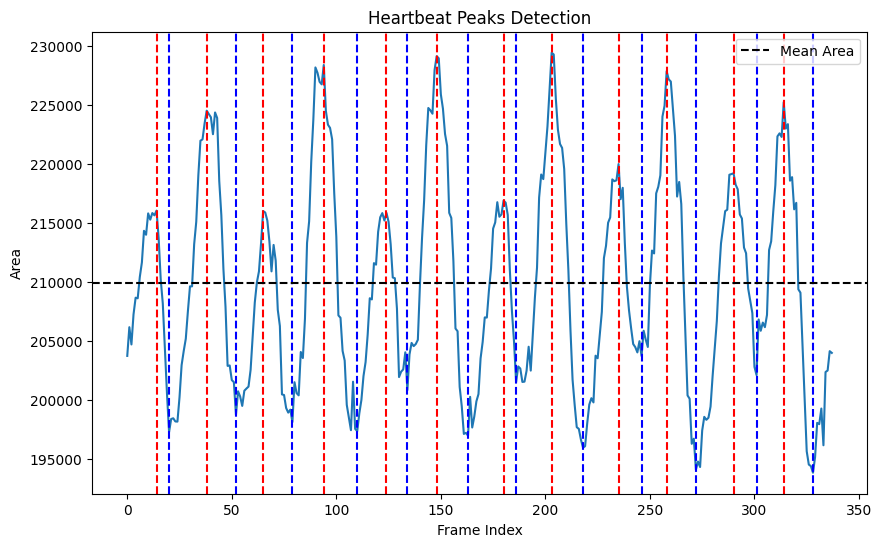

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 12  41  70  97 126 153 187 210 242 264 299 321]
[ 31  52  82 110 139 167 199 222 252 278 308]


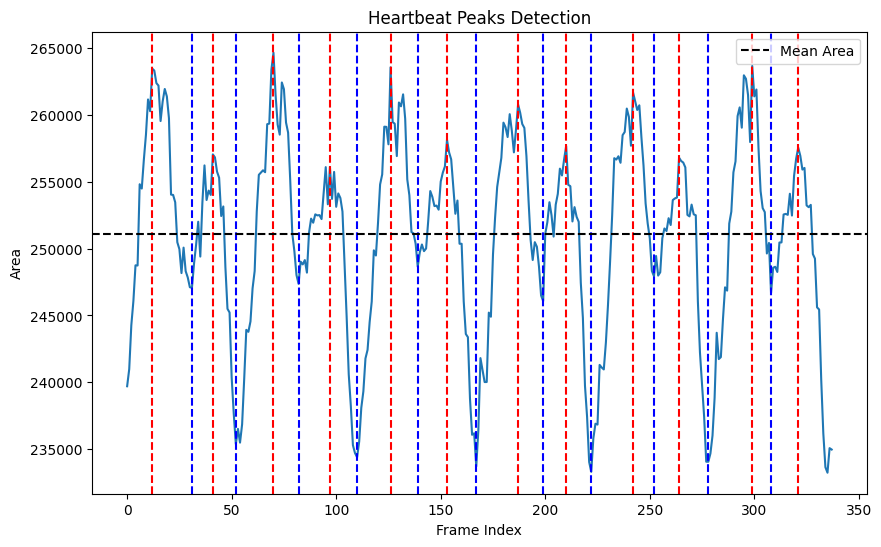

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 11  38  62  90 116 143 165 195 222 248 274 300 327]
[ 23  50  75 102 129 155 181 206 234 260 282 313]


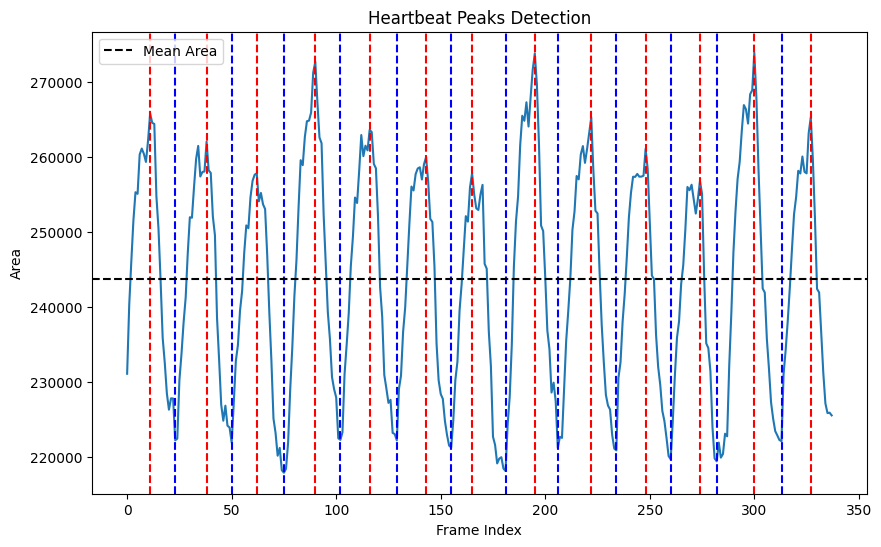

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 15  41  67 118 145 171 196 223 249 275 301 327]
[ 26  51  77 104 130 156 181 209 235 260 284 311]


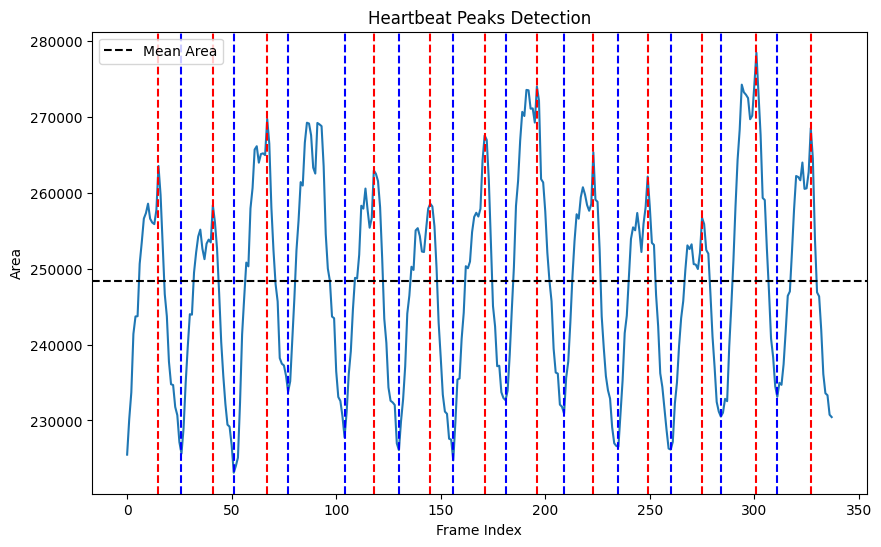

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 10  38  62  88 115 140 166 187 218 244 268 294 314]
[ 20  49  75 102 125 150 177 202 229 255 279 306 332]


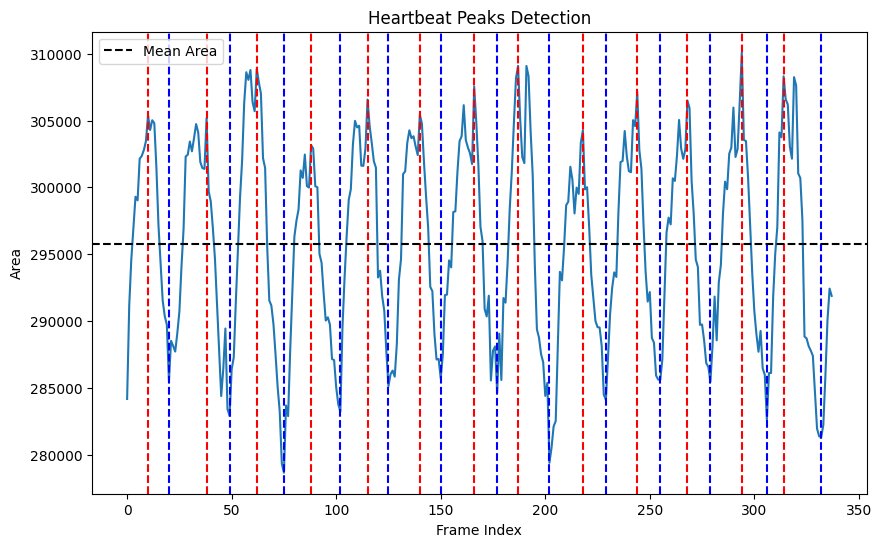

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 25  76 101 129 158 182 209 233 261 288]
[  7  34  60  87 113 141 167 190 216 246 273 299 324]


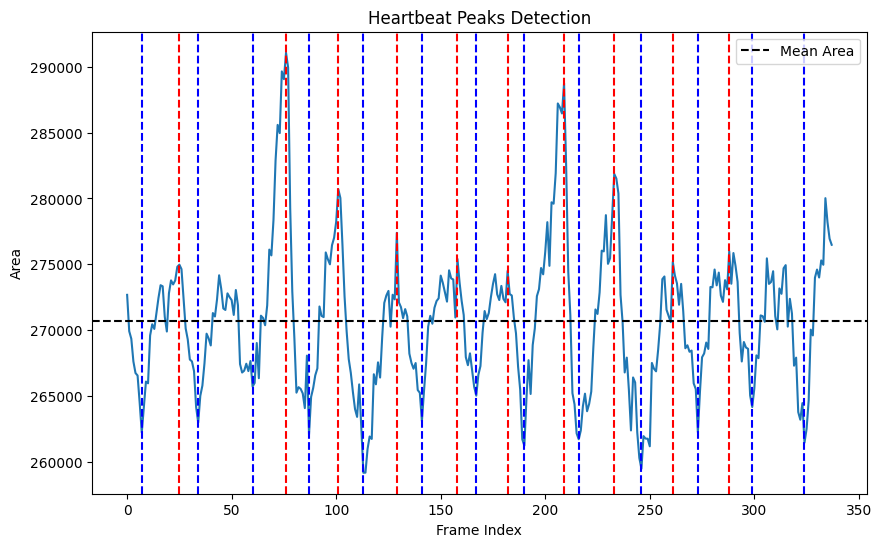

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  9  41  63  96 120 145 178 206 233 255 283 309]
[ 22  52  80 107 132 163 189 217 240 272 300 327]


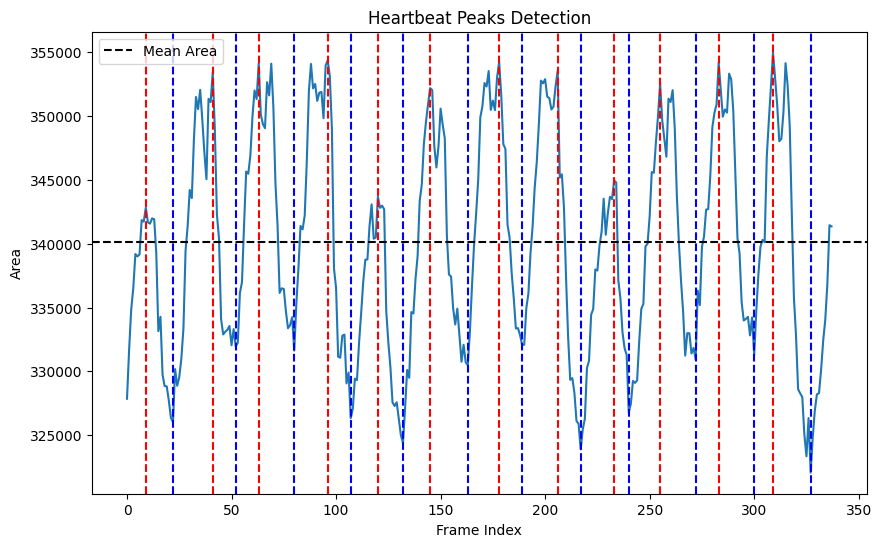

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  9  30  63  90 117 144 171 198 226 251 280 307]
[ 22  49  76 103 131 157 184 211 239 264 291 319]


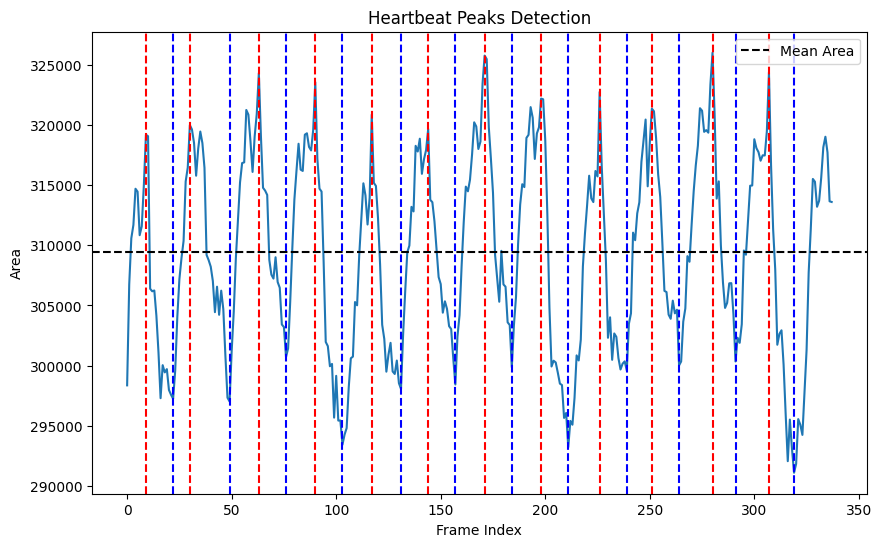

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  9  32  69  99 124 160 191 220 245 281 311]
[ 26  54  85 112 146 178 205 238 266 297 320]


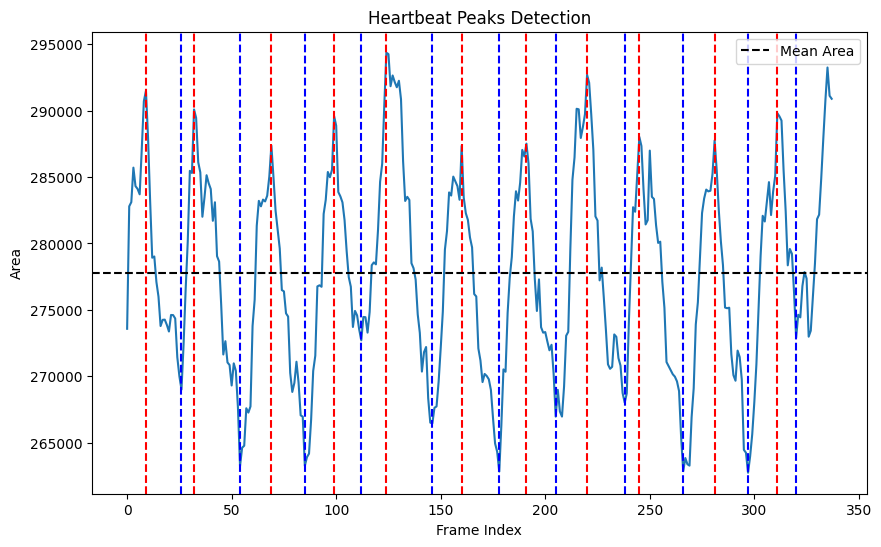

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 35  67  89 127 157 187 213 248 279 303]
[ 20  51  81 111 142 172 202 234 264 293 324]


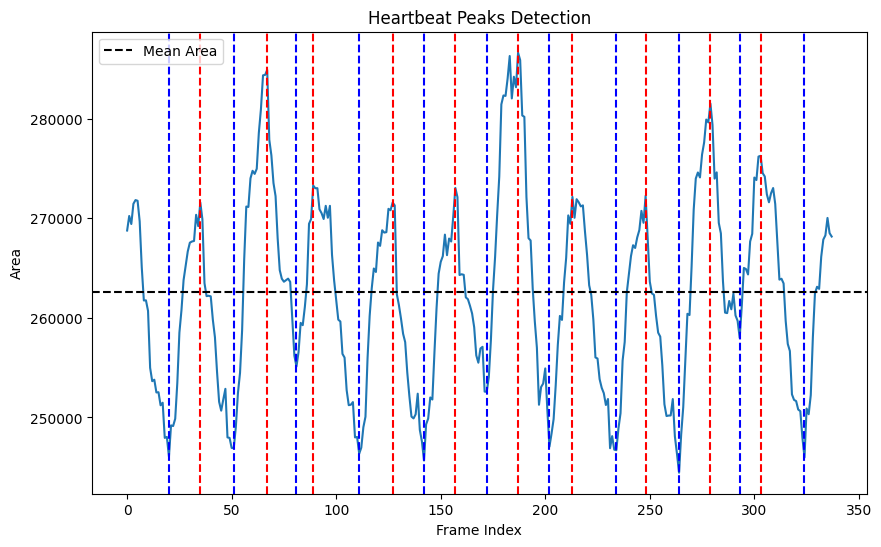

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  6  35  67  96 126 161 186 215 245 275 304]
[ 24  52  81 115 142 174 200 231 261 292 322]


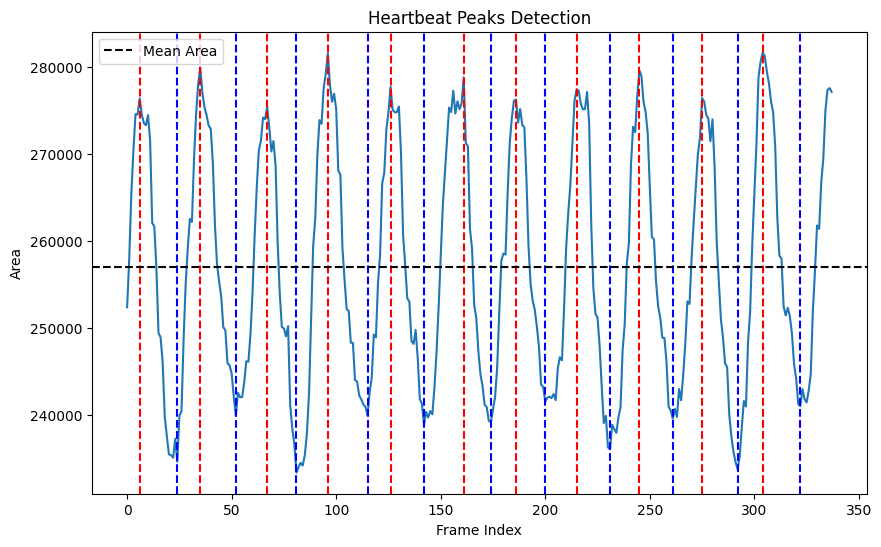

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 18  53  79 113 139 168 202 228 262 286 321]
[  3  35  66  99 123 158 186 217 245 273 305]


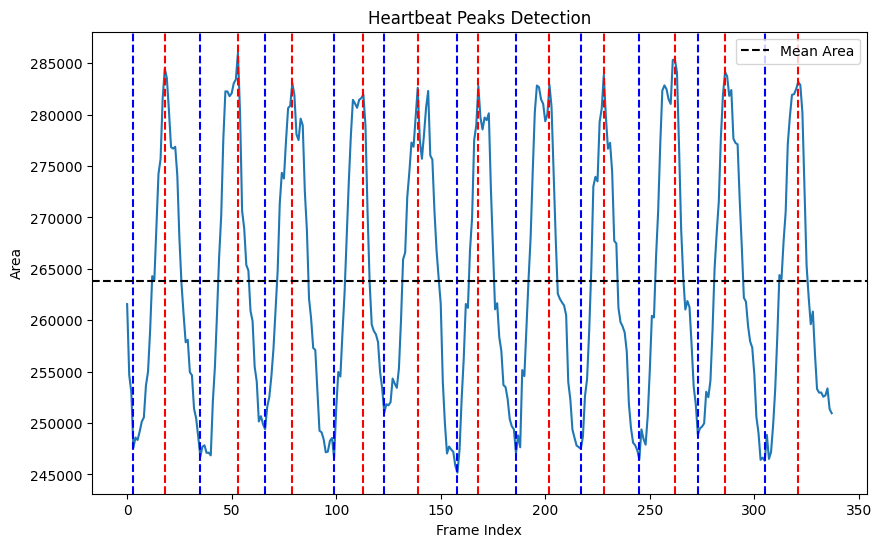

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 32  60  87 116 144 170 201 228 255 284 314]
[ 20  49  72 106 133 156 190 216 243 274 303 331]


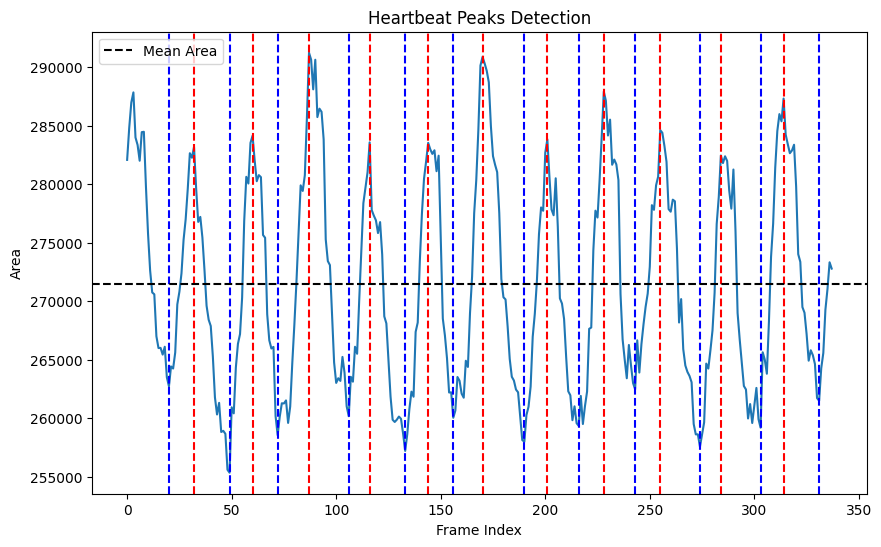

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  3  36  64  92 116 149 178 202 233 263 285 319]
[ 20  49  73 102 134 159 191 219 244 276 305 329]


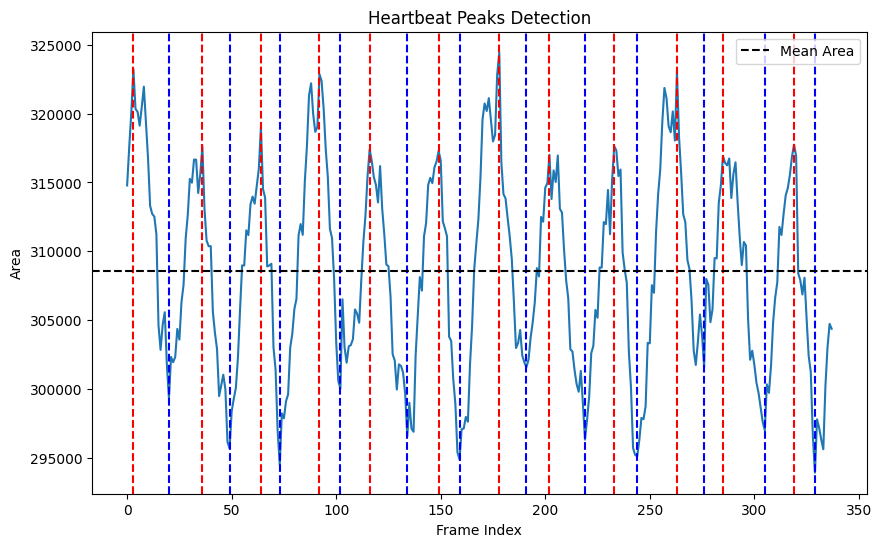

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 14  39  70  95 121 151 177 198 231 258 284 311]
[ 30  54  84 107 137 164 187 218 243 267 297 322]


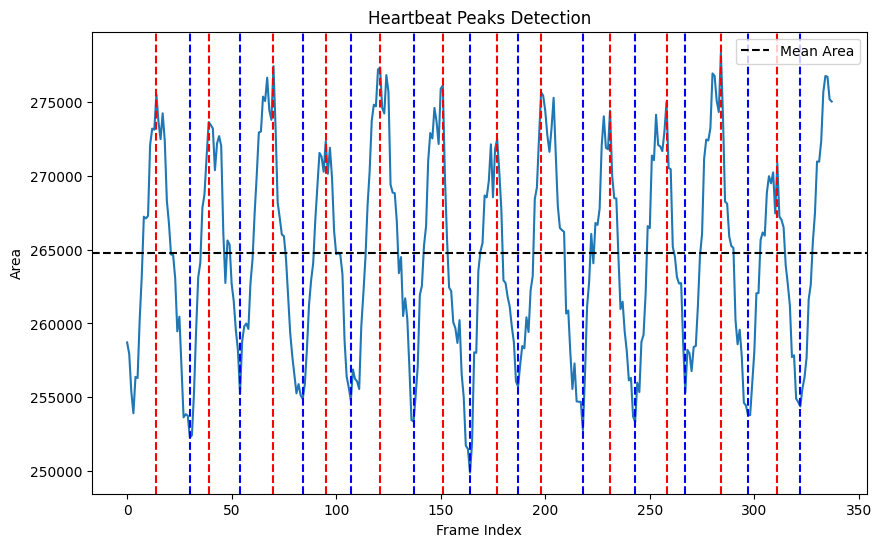

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 16  43  67  97 121 144 170 197 221 248 273 299 323]
[  7  33  54  85 111 138 162 188 213 239 265 290 315]


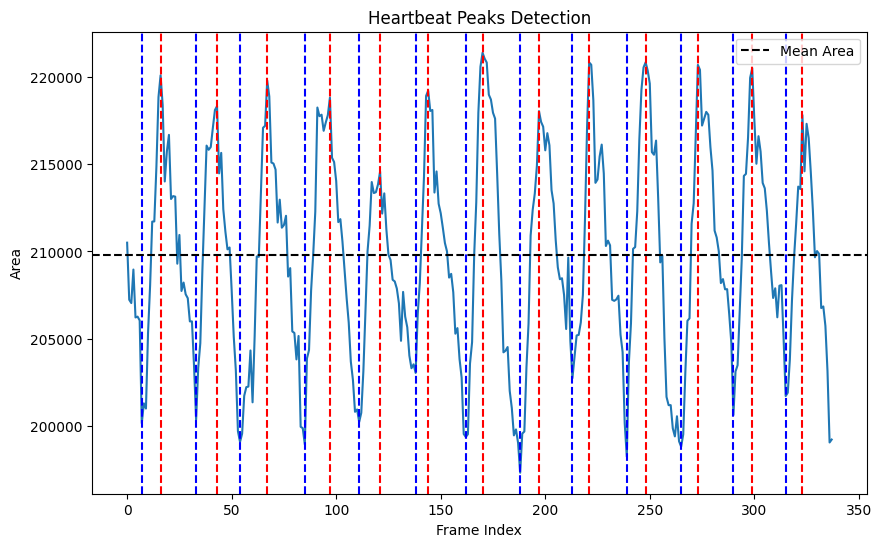

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  9  36  56  96 122 144 172 202 231 268 298 318]
[ 18  50  72 105 133 162 196 217 244 280 305]


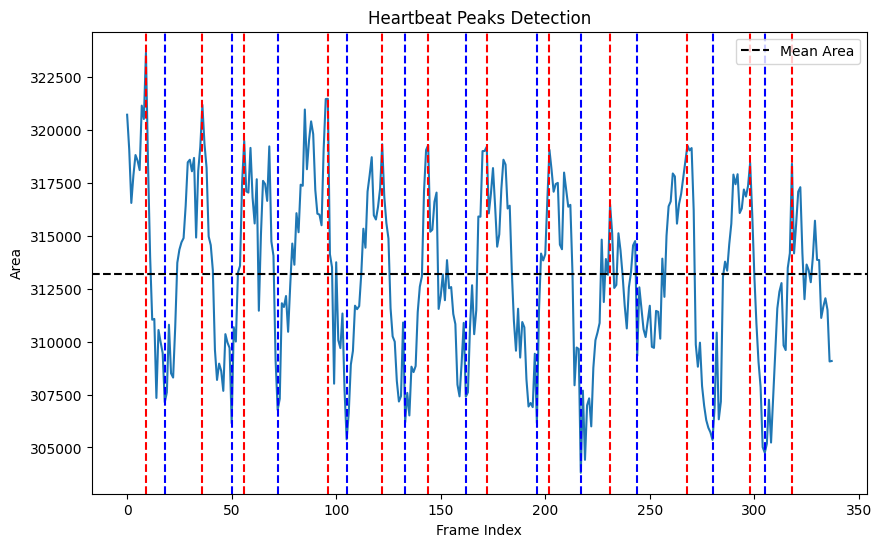

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 27  55  80 112 140 164 198 218 247 283]
[  5  33  64  89 122 151 175 208 237 265 294 319]


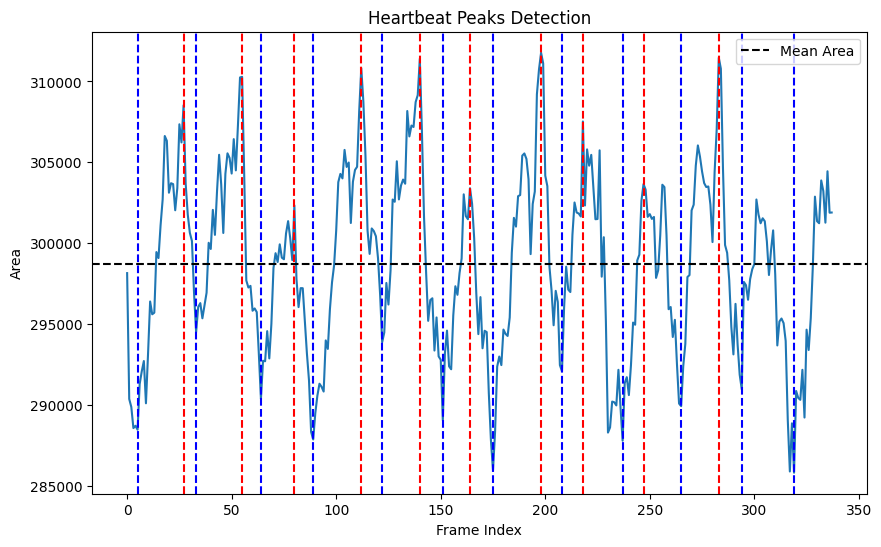

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 29  53 108 130 166 196 253 281]
[  6  34  87 120 149 175 206 234 263 320]


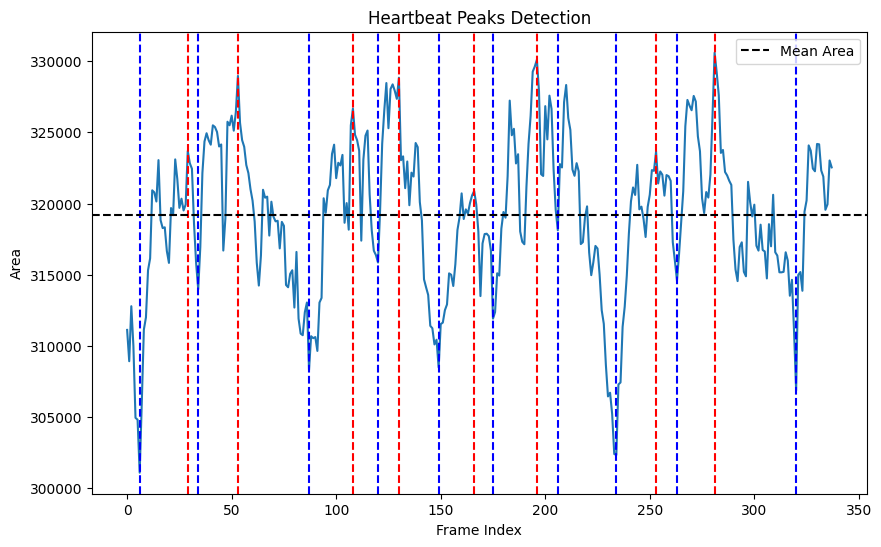

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 15  43  69  97 127 151 178 204 238 259 285 317]
[  5  33  59  86 114 141 167 195 223 247 276 305 327]


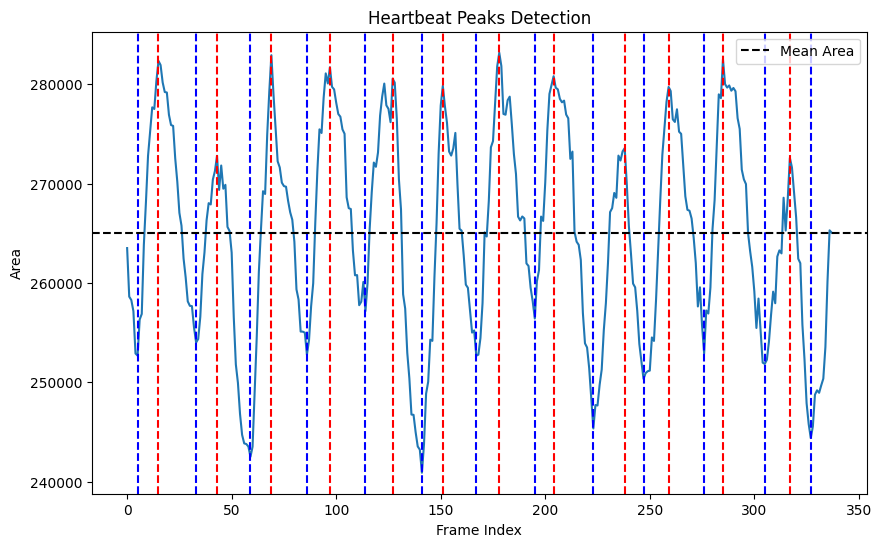

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 11  39  70  91 118 149 175 201 226 254 276 304]
[  3  31  56  84 105 137 163 191 217 241 270 322]


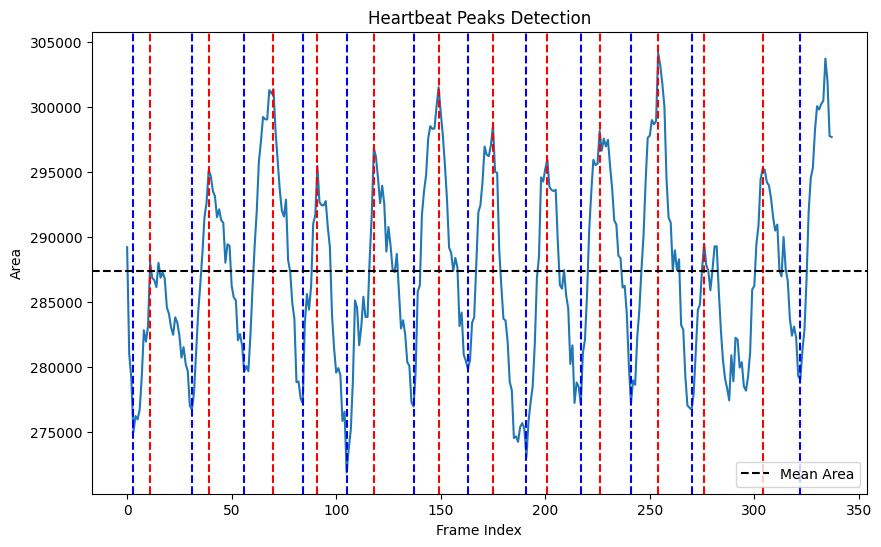

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 20  44  76 104 131 158 186 211 238 270 297 323]
[  7  35  62  89 113 141 173 200 225 255 283 306]


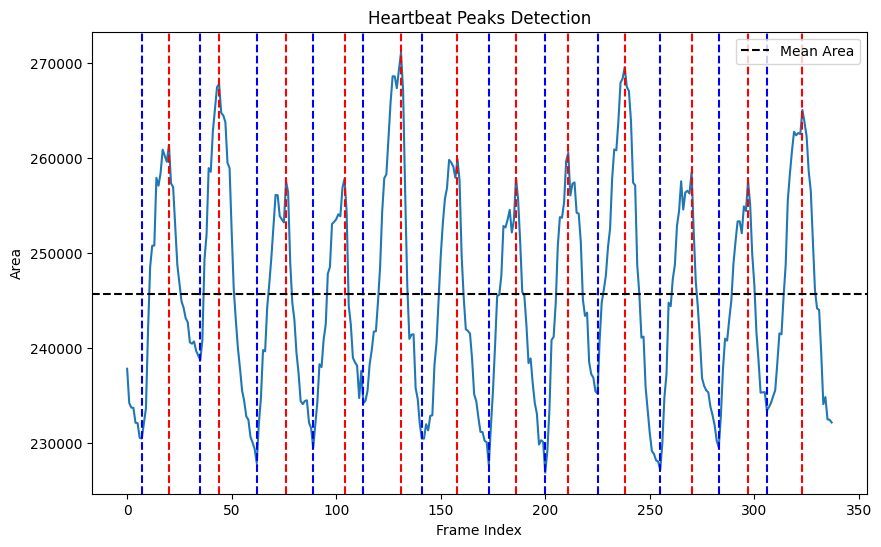

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  9  35  64  94 126 149 177 205 235 262 290 318]
[ 24  54  81 107 135 167 195 220 252 280 309 332]


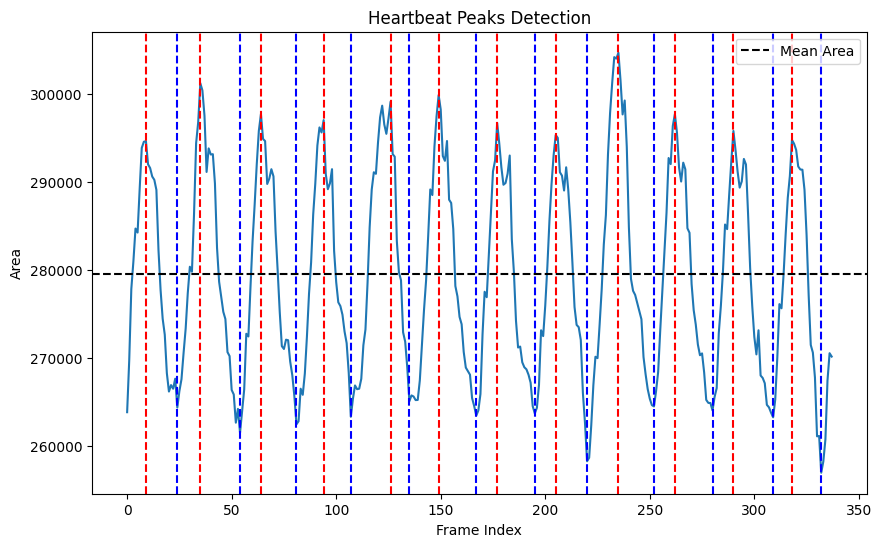

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  8  33  54  79 107 130 153 182 204 228 253 280 304 326]
[ 19  43  69  94 119 143 168 194 218 244 269 290 315]


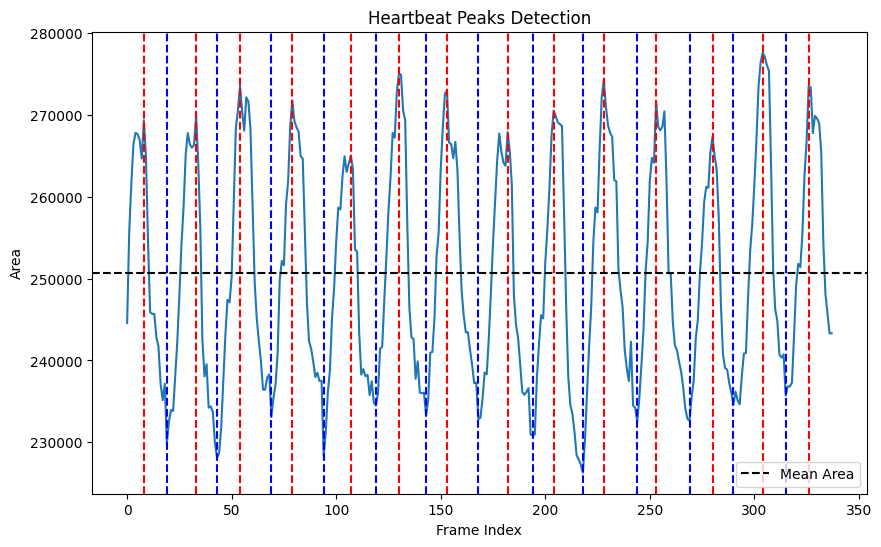

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 28  54  79 105 131 157 182 207 233 258 284 311]
[ 17  38  70  95 121 143 172 197 220 249 274 299 323]


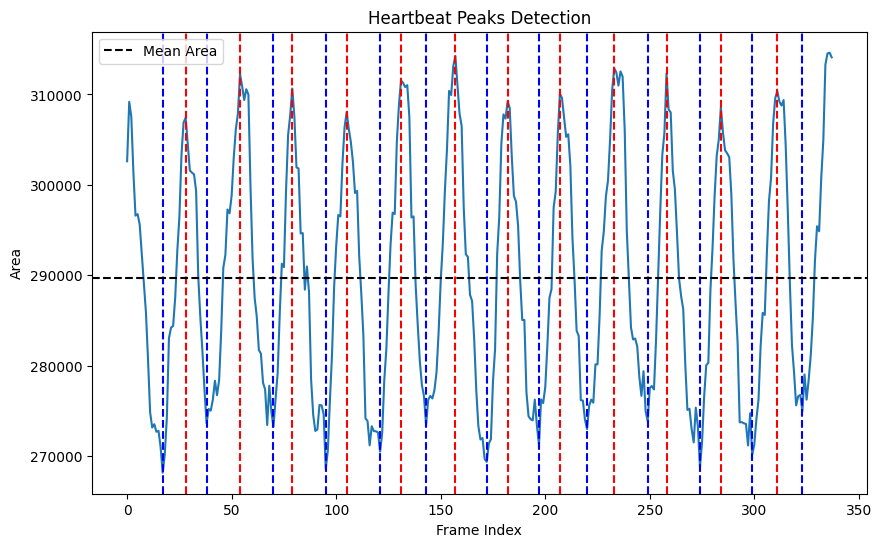

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 15  78 113 158 185 264 291]
[ 57 101 139 168 210 278 309]


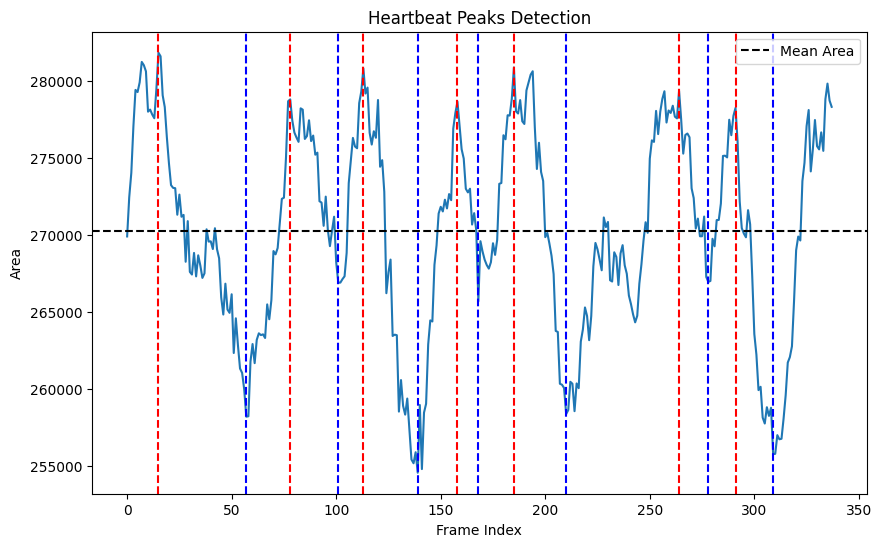

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 15  54  88 123 150 189 224 249 295 319]
[  2  40  73 107 140 176 208 243 278 309]


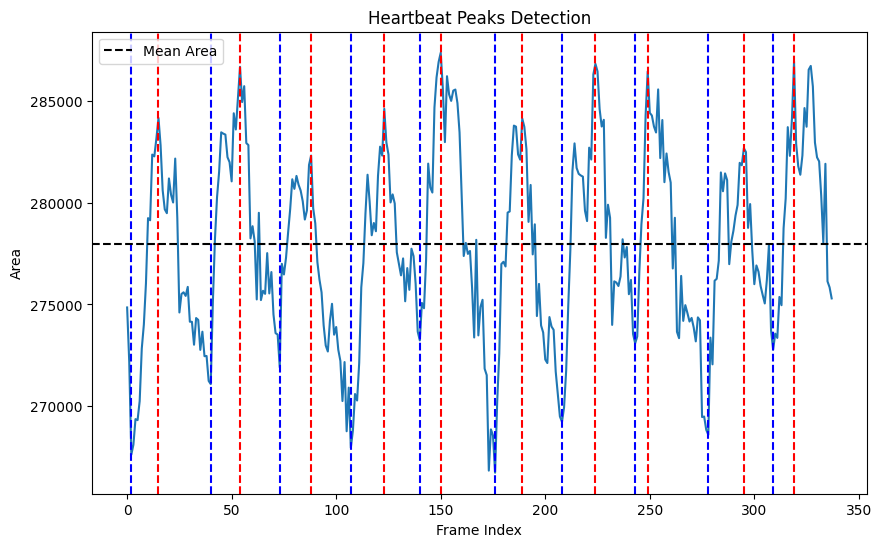

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 33  60  83 112 140 176 201 224 262 288 314]
[ 21  50  75 105 129 160 190 212 248 278 305]


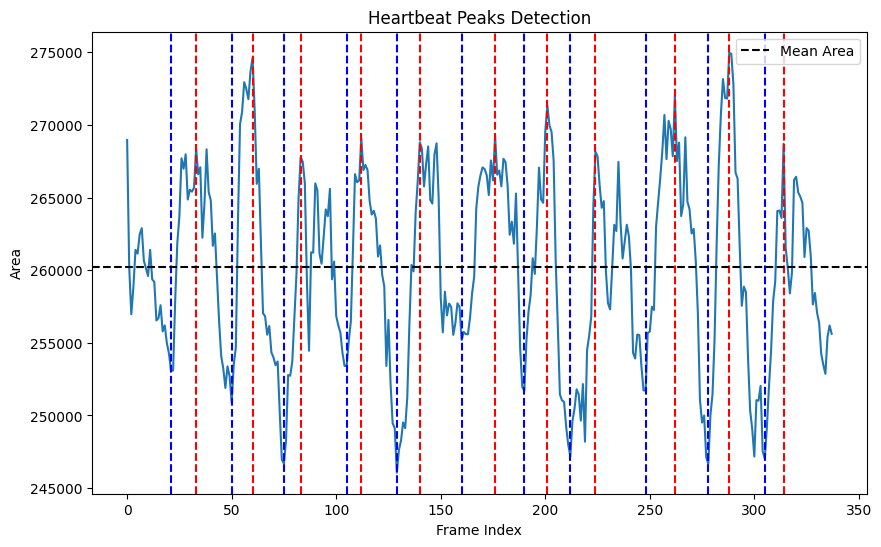

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 16  43  76 104 128 162 189 215 249 277 301]
[ 31  61  91 115 149 177 201 232 263 290 319]


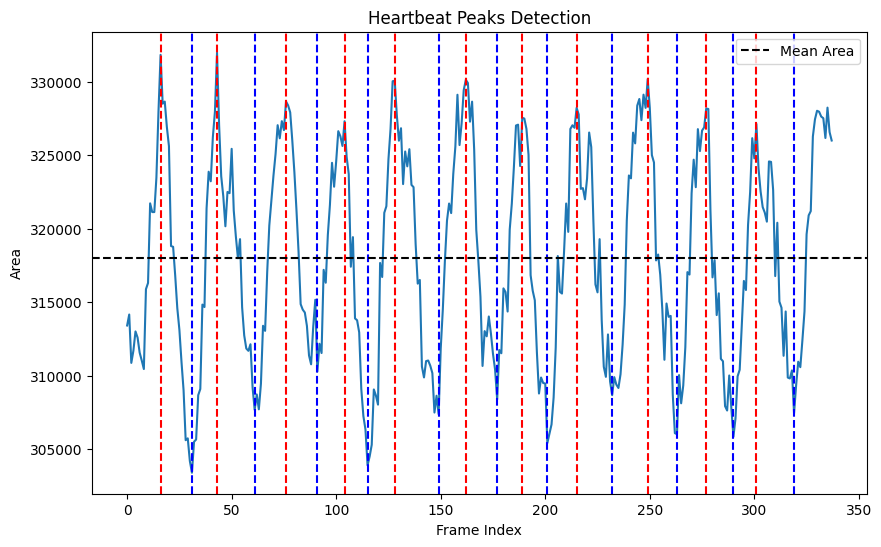

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  2  32  61  90 117 148 175 204 233 262 291 319]
[ 22  51  80 108 137 165 196 225 252 282 310]


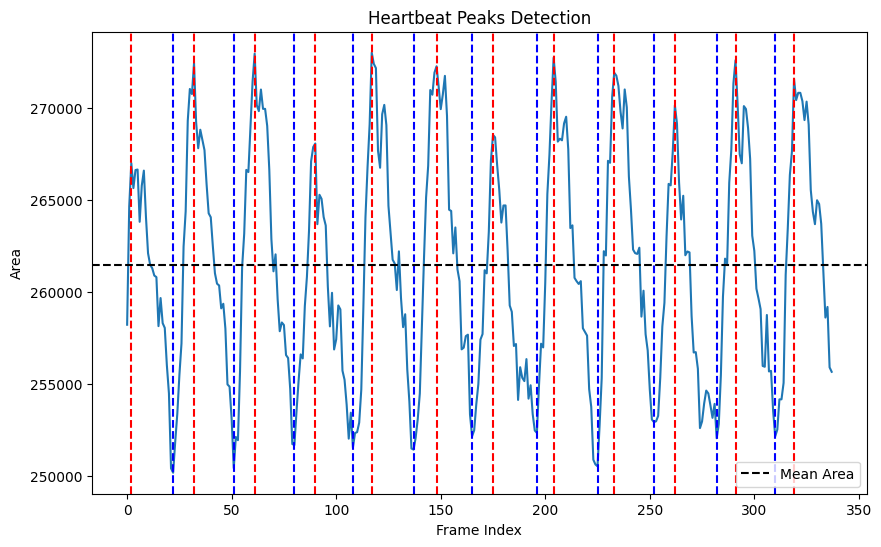

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 27  57  92 117 147 177 207 237 272 297 326]
[ 18  47  78 106 137 166 197 226 256 285 316]


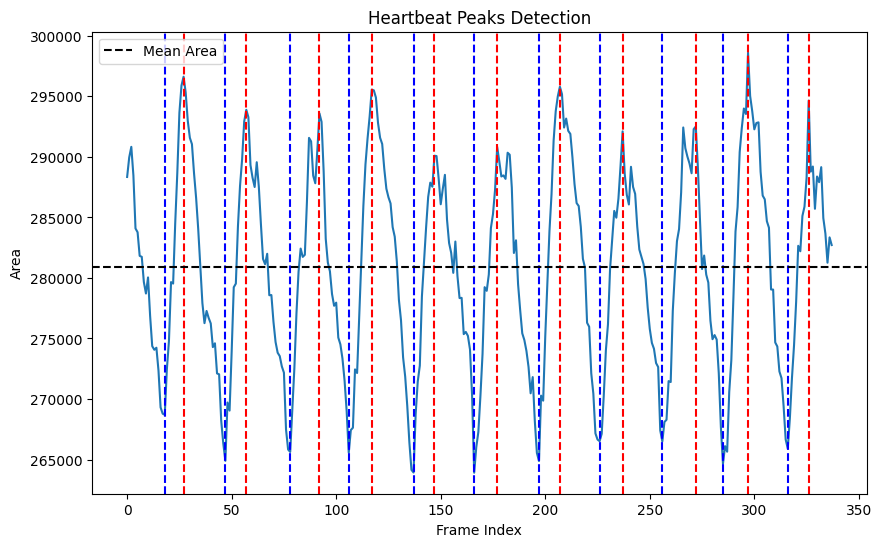

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 19  43  88 111 134 179 203 249 272 295 317]
[  9  30  54  78 102 123 145 170 193 216 239 263 284 308 331]


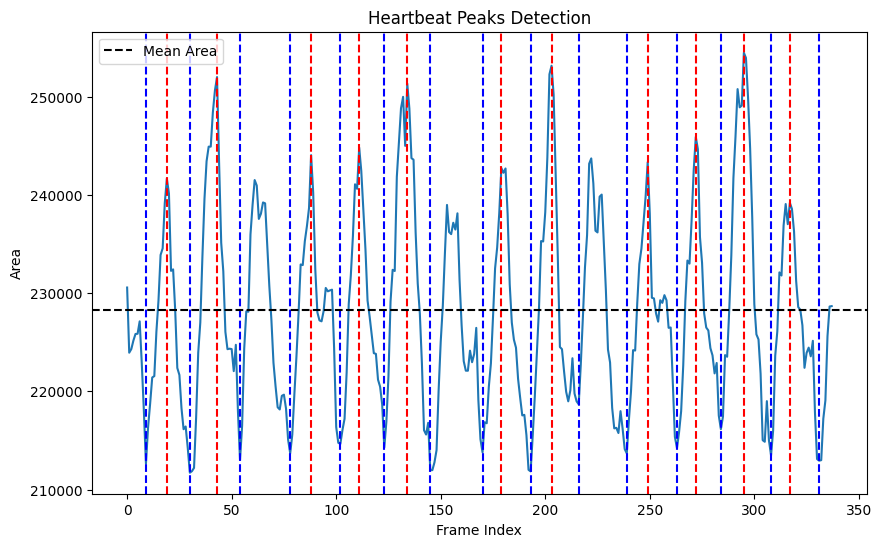

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 14  42  65  89 109 138 161 186 206 233 256 280 301 328]
[ 32  55  79 103 128 151 174 199 222 246 270 293 317]


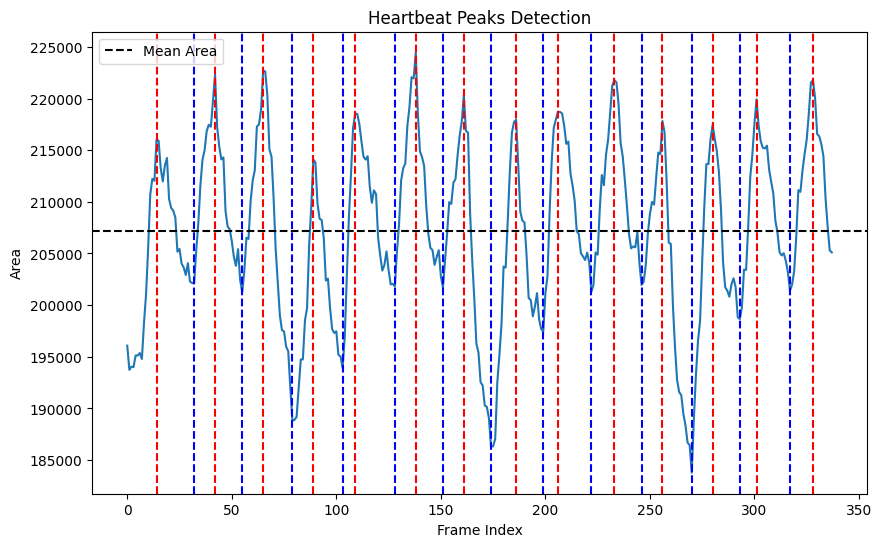

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 14  36  63  87 112 134 159 184 209 233 257 280 308 330]
[ 24  49  72  97 122 147 167 195 220 244 270 293 317]


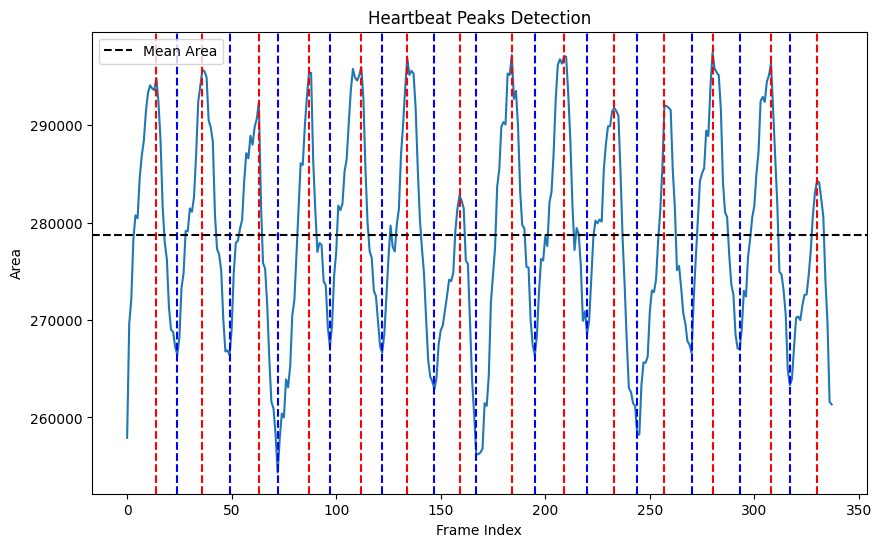

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 11  37  64  95 118 144 175 202 228 251 282 304]
[  1  27  55  81 108 130 161 188 216 243 269 297 323]


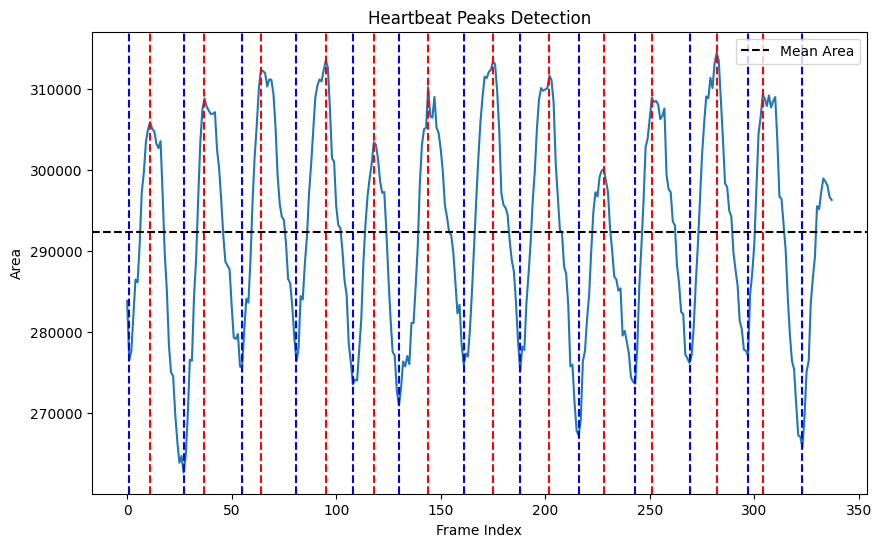

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 19  56  89 121 153 186 218 247 282 317]
[ 41  74 106 140 173 204 237 267 301]


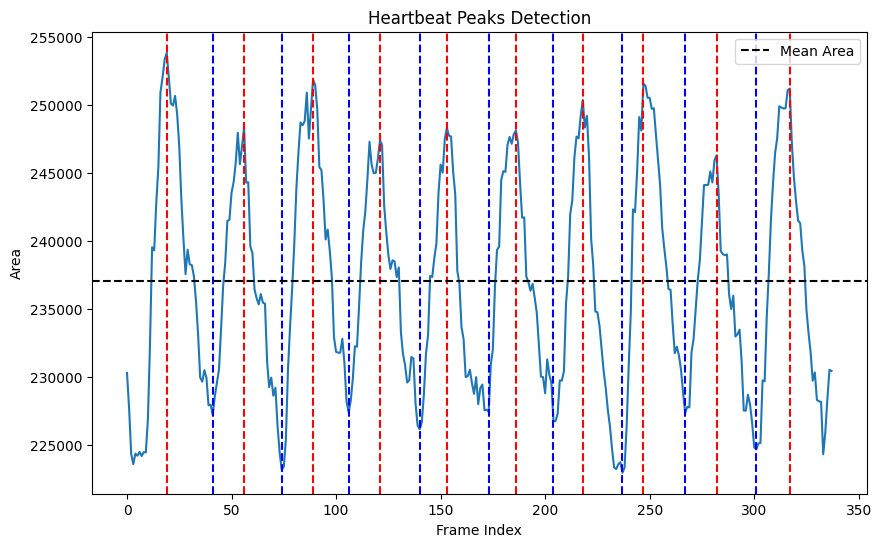

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 32  67  98 134 164 202 230 265 299]
[ 19  53  86 121 148 186 219 253 287 319]


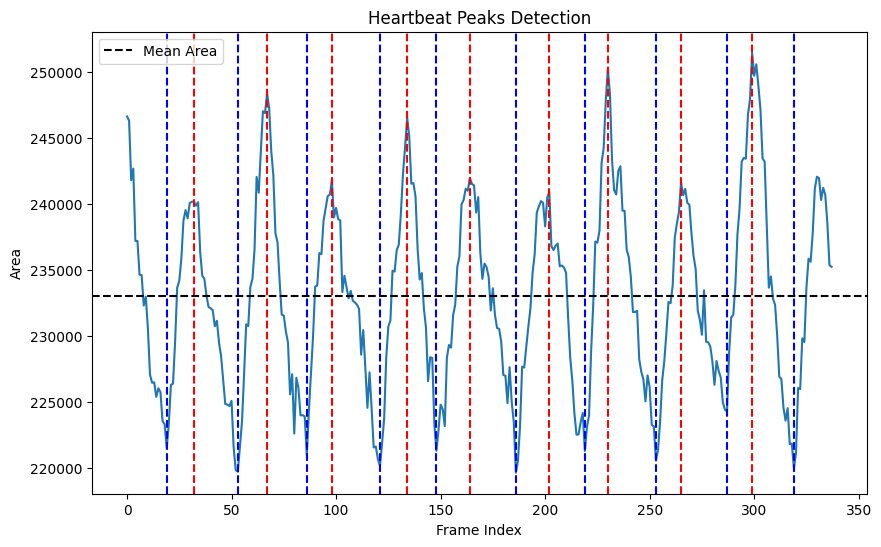

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[  8  39  68  99 127 158 195 218 254 277 307]
[ 26  54  88 113 149 173 203 236 265 298 323]


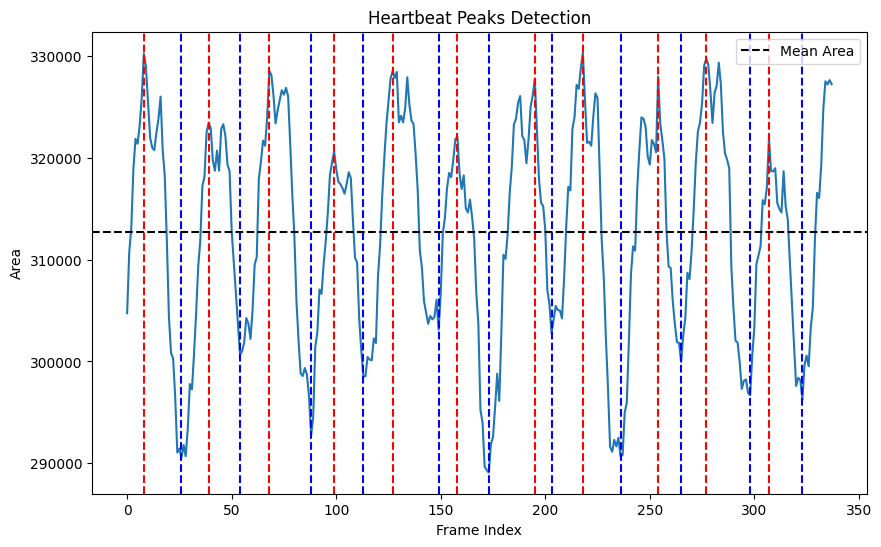

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 24  55  86 115 145 170 204 235 258 294 324]
[  7  37  67  94 124 159 187 216 244 273 303]


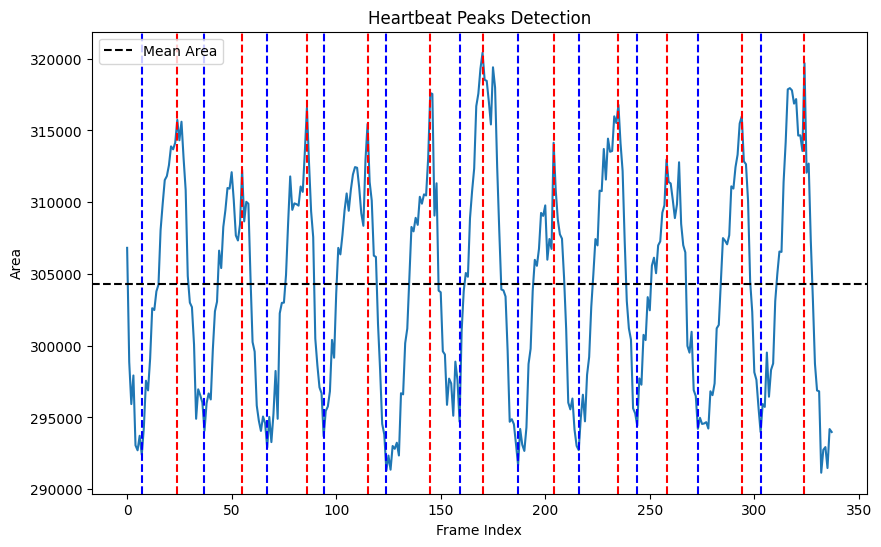

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 10  44  73 100 129 159 185 211 242 264 298 327]
[ 29  58  82 113 142 169 199 226 253 282 311]


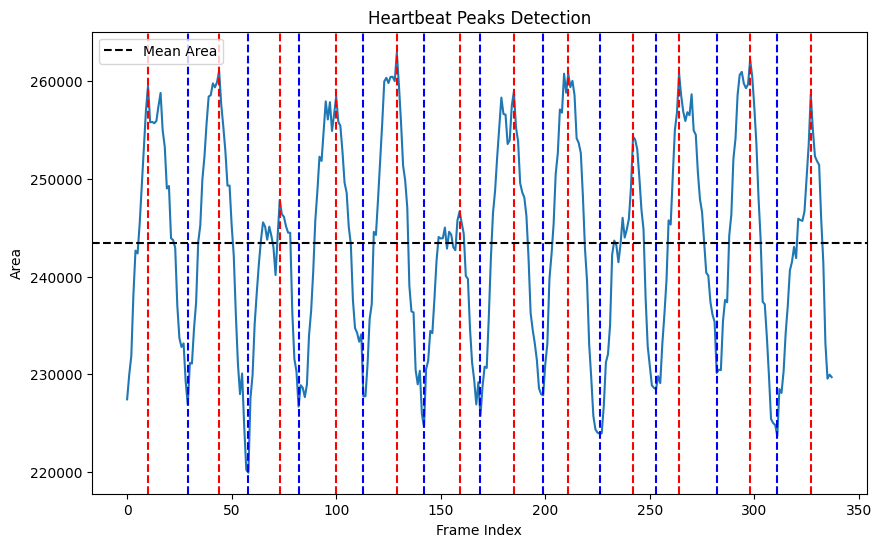

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 18  44  77 101 130 161 192 218 246 272 304]
[  6  31  64  91 116 149 177 202 235 258 292 320]


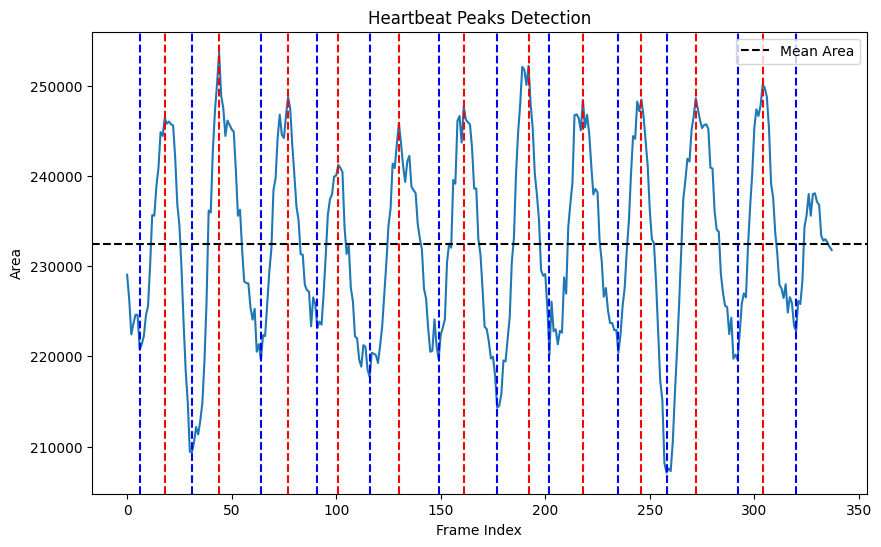

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 25  53  80 107 136 161 187 214 242 272 297 324]
[ 14  42  68  97 124 149 178 204 232 258 287 314]


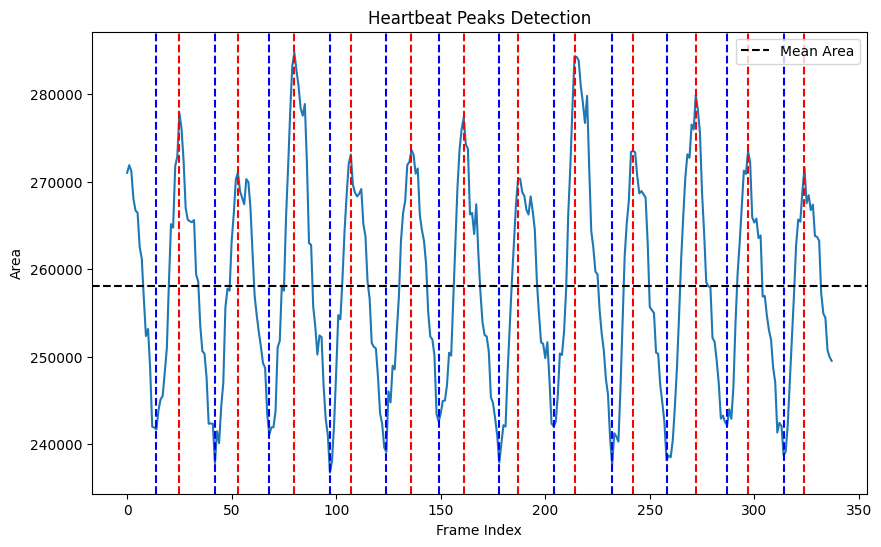

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 17  46  68  92 117 145 174 196 222 248 275 300 326]
[  3  33  56  80 108 133 160 186 211 239 264 289 317]


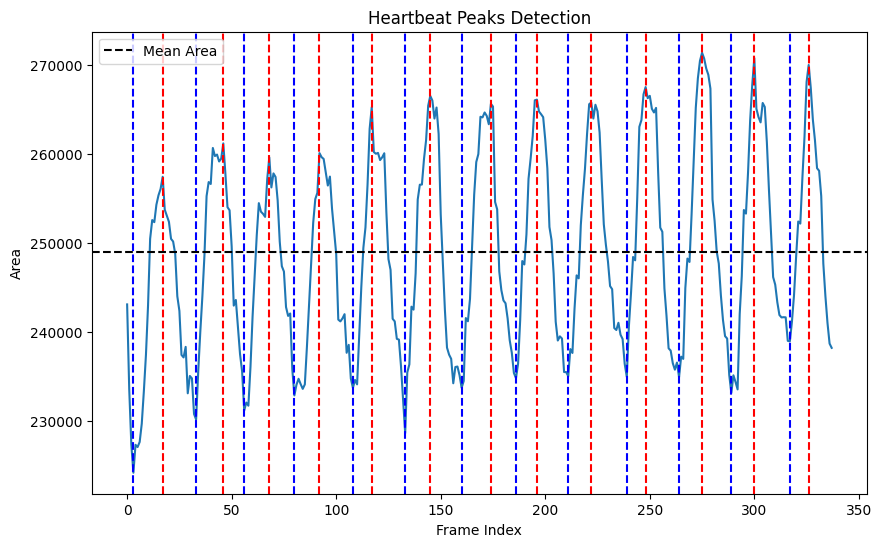

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

[ 16  45  74 104 132 160 191 220 248 276 307]
[ 32  61  88 117 146 177 205 234 262 292 322]


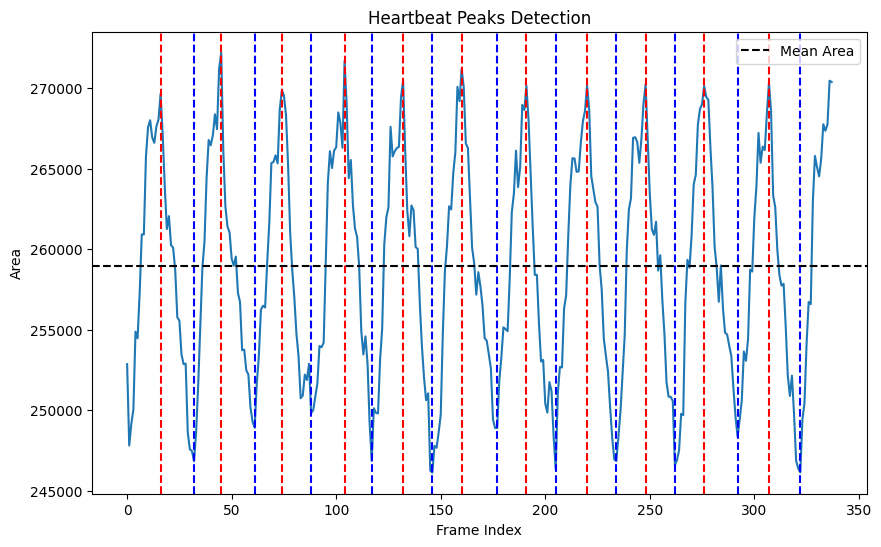

<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video_data[col] = values
<ipython-input-10-60c1f02b52c6>:84: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  video

In [ ]:
final_data = pd.DataFrame(columns=["starting frame", "trough_frames", "peak_area", "trough_area"] +
                          [f"peak_quadrant_{i+1}" for i in range(81)] +
                          [f"trough_quadrant_{i+1}" for i in range(81)])

for i in range(len(study_id)):
    if "LOTR" in study_id[i]:
        vid_path = '/content/drive/MyDrive/Tolkien strain data June 2024/LoTR Videos LAX B mode  7 d/' + video_name[i]
    elif "TH" in study_id[i]:
        vid_path = '/content/drive/MyDrive/Tolkien strain data June 2024/Hobbit videos LAX B mode 7 d/' + video_name[i]
    elif "SIM" in study_id[i]:
        vid_path = '/content/drive/MyDrive/Tolkien strain data June 2024/Silmarillion Videos LAX B mode 7 d/' + video_name[i]

    frames = extract_frames(vid_path, extract_rate=30)  # Extract N frame per second
    heart = [crop_to_echo(frame) for frame in frames]  # Crop out echocardiograms
    ecg = [crop_to_echo(frame, showECG=True) for frame in frames]  # Crop out electrocardiogram
    ECG_data = pd.DataFrame({'Heart': heart, 'ECG': ecg})  # Create dataframe
    heart = ECG_data["Heart"].tolist()  # Load your echocardiogram frames here

    # Calculate the non-zero area (black area) over time with visualization
    areas_over_time = calculate_non_zero_area_over_time(heart, visualize=False)
    mean_area = np.mean(areas_over_time)

    # Calculate the quadrant area changes over time
    quadrant_area_changes = calculate_quadrant_area_changes(heart)

    # Calculate mean area change for each quadrant
    mean_area_changes = np.mean(quadrant_area_changes, axis=0)

    # Baseline correction (subtract mean)
    baseline = areas_over_time - np.mean(areas_over_time)
    baseline = np.array(baseline)

    # Peak and trough Detection
    peaks, _ = signal.find_peaks(baseline, prominence=7000, distance=20)  # Adjust 'prominence' as needed
    troughs, _ = signal.find_peaks(-baseline, prominence=7000, distance=20)  # Adjust 'prominence' as needed

    print(peaks)
    print(troughs)

    # Visualize Peaks
    plt.figure(figsize=(10, 6))
    plt.plot(areas_over_time)
    for peak in peaks:
        plt.axvline(x=peak, color='r', linestyle='--')
    for trough in troughs:
        plt.axvline(x=trough, color='b', linestyle='--')
    plt.axhline(y=mean_area, color='k', linestyle='--', label='Mean Area')
    plt.xlabel("Frame Index")
    plt.ylabel("Area")
    plt.title("Heartbeat Peaks Detection")
    plt.legend()
    plt.show()

    frames_of_heartbeat = peaks
    data = {"starting frame": frames_of_heartbeat}
    video_data = pd.DataFrame(data)
    troughs_df = pd.DataFrame(troughs, columns=['trough_frames'])

    # Define "Through" as the trough frame that comes directly after the peak
    troughs_after_peaks = []
    for peak in video_data['starting frame']:
        next_troughs = troughs_df[troughs_df['trough_frames'] > peak]['trough_frames']
        if not next_troughs.empty:
            troughs_after_peaks.append(next_troughs.iloc[0])
        else:
            troughs_after_peaks.append(np.nan)

    video_data['trough_frames'] = troughs_after_peaks
    video_data['peak_area'] = video_data['starting frame'].apply(lambda x: areas_over_time[x])
    video_data['trough_area'] = video_data['trough_frames'].apply(lambda x: areas_over_time[int(x)] if not np.isnan(x) else np.nan)

    peak_frames = video_data['starting frame'].values
    trough_frames = video_data['trough_frames'].values

    peak_quadrant_areas, trough_quadrant_areas = get_quadrant_areas_at_frames(heart, peak_frames, trough_frames)

    # Add peak and trough quadrant areas to the DataFrame
    peak_quadrant_cols = {f"peak_quadrant_{i+1}": [areas[i] for areas in peak_quadrant_areas] for i in range(81)}
    trough_quadrant_cols = {f"trough_quadrant_{i+1}": [areas[i] for areas in trough_quadrant_areas] for i in range(81)}

    for col, values in peak_quadrant_cols.items():
        video_data[col] = values
    for col, values in trough_quadrant_cols.items():
        video_data[col] = values

    video_data["video_name"] = [video_name[i]] * len(peak_frames)

    final_data = pd.concat([final_data, video_data], ignore_index=True)  # Concatenate and reset index

# Save the final data to a CSV file if needed
final_data.to_csv("final_data.csv", index=False)


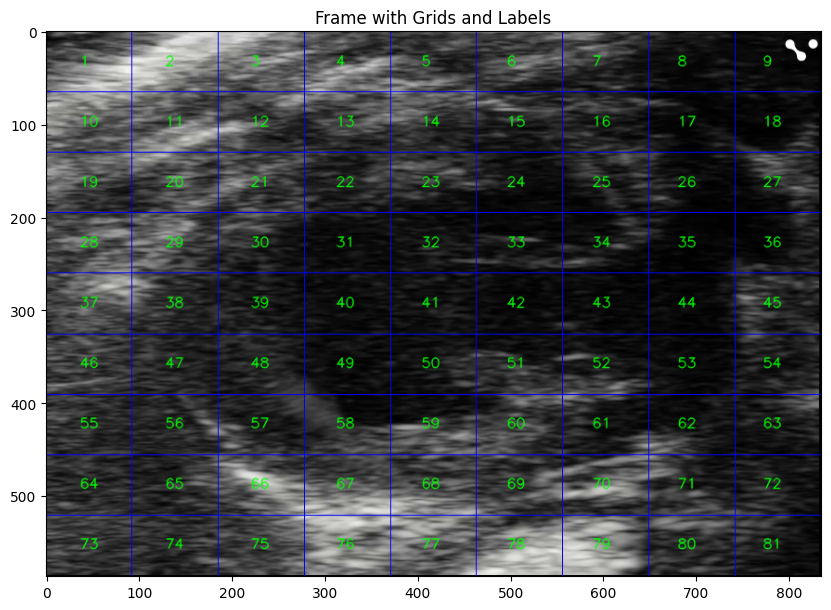

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def draw_grids_on_frame_with_labels(frame, grid_size=(9, 9)):
    """
    Draws grids with labels on the given frame.
    :param frame: The frame on which grids are to be drawn.
    :param grid_size: Tuple indicating the number of rows and columns.
    :return: Frame with grids drawn and labeled.
    """
    frame_with_grids = frame.copy()
    height, width = frame_with_grids.shape[:2]
    rows, cols = grid_size

    # Calculate the width and height of each grid cell
    cell_width = width // cols
    cell_height = height // rows

    # Draw horizontal lines
    for i in range(1, rows):
        y = i * height // rows
        cv2.line(frame_with_grids, (0, y), (width, y), (255, 0, 0), 1)

    # Draw vertical lines
    for i in range(1, cols):
        x = i * width // cols
        cv2.line(frame_with_grids, (x, 0), (x, height), (255, 0, 0), 1)

    # Label the grids
    grid_number = 1
    for i in range(rows):
        for j in range(cols):
            # Calculate the center of the grid cell
            x_center = j * cell_width + cell_width // 2
            y_center = i * cell_height + cell_height // 2

            # Put the grid number at the center of the cell
            cv2.putText(frame_with_grids, str(grid_number), (x_center - 10, y_center + 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1, cv2.LINE_AA)
            grid_number += 1

    return frame_with_grids

# Assuming 'heart' contains your echocardiogram frames
sample_frame = heart[0]  # Taking the first frame as a sample

# Draw grids with labels on the sample frame
frame_with_grids_and_labels = draw_grids_on_frame_with_labels(sample_frame)

# Display the frame with grids and labels
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(frame_with_grids_and_labels, cv2.COLOR_BGR2RGB))
plt.title("Frame with Grids and Labels")
plt.show()


In [ ]:
final_data.rename(columns={'video_name': 'Video'}, inplace=True)


In [ ]:
final_data

,starting frame,trough_frames,peak_area,trough_area,peak_quadrant_1,peak_quadrant_2,peak_quadrant_3,peak_quadrant_4,peak_quadrant_5,peak_quadrant_6,...,trough_quadrant_73,trough_quadrant_74,trough_quadrant_75,trough_quadrant_76,trough_quadrant_77,trough_quadrant_78,trough_quadrant_79,trough_quadrant_80,trough_quadrant_81,Video
0,29,41.0,349181,322963.0,5030,5980,5980,5608,5672,5959,...,4934.0,3772.0,2891.0,5441.0,5953.0,5980.0,5946.0,5980.0,5644.0,B1LA PIPPIN 7D 30.11.20_2020-11-30-10-38-38.mp4
1,53,71.0,349259,321645.0,4956,5965,5980,5706,5765,5980,...,3274.0,4635.0,3645.0,5533.0,5980.0,5956.0,5980.0,5971.0,5672.0,B1LA PIPPIN 7D 30.11.20_2020-11-30-10-38-38.mp4
2,81,96.0,359394,321520.0,4570,5959,5980,5980,5340,5980,...,3966.0,4134.0,3235.0,5405.0,5980.0,5959.0,5980.0,5980.0,5699.0,B1LA PIPPIN 7D 30.11.20_2020-11-30-10-38-38.mp4
3,107,125.0,349571,322822.0,4947,5980,5980,5690,5653,5980,...,4386.0,3751.0,4494.0,5351.0,5980.0,5950.0,5939.0,5979.0,5625.0,B1LA PIPPIN 7D 30.11.20_2020-11-30-10-38-38.mp4
4,133,152.0,350389,323717.0,4946,5980,5980,5625,5765,5970,...,4608.0,3585.0,4035.0,5176.0,5980.0,5980.0,5980.0,5952.0,5521.0,B1LA PIPPIN 7D 30.11.20_2020-11-30-10-38-38.mp4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
824,191,205.0,270148,246309.0,5483,5980,5980,5808,5108,4719,...,5614.0,3586.0,5927.0,5980.0,5980.0,5932.0,5755.0,5830.0,2946.0,b1la Morgoth 7d 08.02.21_2021-02-08-11-39-20.mp4
825,220,234.0,270170,246834.0,5548,5980,5980,5956,5082,4462,...,5112.0,4194.0,5845.0,5980.0,5980.0,5741.0,5800.0,4558.0,1979.0,b1la Morgoth 7d 08.02.21_2021-02-08-11-39-20.mp4
826,248,262.0,270250,246581.0,5481,5980,5980,5677,5031,4881,...,5089.0,3947.0,5823.0,5980.0,5980.0,5692.0,5834.0,4682.0,1386.0,b1la Morgoth 7d 08.02.21_2021-02-08-11-39-20.mp4
827,276,292.0,270139,248350.0,5477,5980,5980,5746,4830,4993,...,5410.0,4550.0,5871.0,5980.0,5980.0,5825.0,5846.0,4428.0,1533.0,b1la Morgoth 7d 08.02.21_2021-02-08-11-39-20.mp4


In [ ]:
merged_final = pd.merge(final_data, videos[['Video', 'Class', 'Name', 'MP treatment']], on='Video', how='left')


In [ ]:
merged_final

,starting frame,trough_frames,peak_area,trough_area,peak_quadrant_1,peak_quadrant_2,peak_quadrant_3,peak_quadrant_4,peak_quadrant_5,peak_quadrant_6,...,trough_quadrant_76,trough_quadrant_77,trough_quadrant_78,trough_quadrant_79,trough_quadrant_80,trough_quadrant_81,Video,Class,Name,MP treatment
0,29,41.0,349181,322963.0,5030,5980,5980,5608,5672,5959,...,5441.0,5953.0,5980.0,5946.0,5980.0,5644.0,B1LA PIPPIN 7D 30.11.20_2020-11-30-10-38-38.mp4,2,PIPPIN,AngII+PLX
1,53,71.0,349259,321645.0,4956,5965,5980,5706,5765,5980,...,5533.0,5980.0,5956.0,5980.0,5971.0,5672.0,B1LA PIPPIN 7D 30.11.20_2020-11-30-10-38-38.mp4,2,PIPPIN,AngII+PLX
2,81,96.0,359394,321520.0,4570,5959,5980,5980,5340,5980,...,5405.0,5980.0,5959.0,5980.0,5980.0,5699.0,B1LA PIPPIN 7D 30.11.20_2020-11-30-10-38-38.mp4,2,PIPPIN,AngII+PLX
3,107,125.0,349571,322822.0,4947,5980,5980,5690,5653,5980,...,5351.0,5980.0,5950.0,5939.0,5979.0,5625.0,B1LA PIPPIN 7D 30.11.20_2020-11-30-10-38-38.mp4,2,PIPPIN,AngII+PLX
4,133,152.0,350389,323717.0,4946,5980,5980,5625,5765,5970,...,5176.0,5980.0,5980.0,5980.0,5952.0,5521.0,B1LA PIPPIN 7D 30.11.20_2020-11-30-10-38-38.mp4,2,PIPPIN,AngII+PLX
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
824,191,205.0,270148,246309.0,5483,5980,5980,5808,5108,4719,...,5980.0,5980.0,5932.0,5755.0,5830.0,2946.0,b1la Morgoth 7d 08.02.21_2021-02-08-11-39-20.mp4,2,MORGOTH,AngII+PLX
825,220,234.0,270170,246834.0,5548,5980,5980,5956,5082,4462,...,5980.0,5980.0,5741.0,5800.0,4558.0,1979.0,b1la Morgoth 7d 08.02.21_2021-02-08-11-39-20.mp4,2,MORGOTH,AngII+PLX
826,248,262.0,270250,246581.0,5481,5980,5980,5677,5031,4881,...,5980.0,5980.0,5692.0,5834.0,4682.0,1386.0,b1la Morgoth 7d 08.02.21_2021-02-08-11-39-20.mp4,2,MORGOTH,AngII+PLX
827,276,292.0,270139,248350.0,5477,5980,5980,5746,4830,4993,...,5980.0,5980.0,5825.0,5846.0,4428.0,1533.0,b1la Morgoth 7d 08.02.21_2021-02-08-11-39-20.mp4,2,MORGOTH,AngII+PLX


In [ ]:

# Define a small value to replace zero for safe division
epsilon = 1e-10

# Calculate percent changes and absolute changes for total area
merged_final['percent_change_total_area'] = abs((merged_final['trough_area'] - merged_final['peak_area']) / (merged_final['peak_area'] + epsilon))
merged_final['change_total_area'] = abs(merged_final['trough_area'] - merged_final['peak_area'])


# Calculate percent changes and absolute changes for each of the 36 quadrants
for i in range(81):
    peak_col = f'peak_quadrant_{i+1}'
    trough_col = f'trough_quadrant_{i+1}'
    percent_change_col = f'percent_change_quadrant_{i+1}'
    change_col = f'change_quadrant_{i+1}'

    merged_final[percent_change_col] = abs((merged_final[trough_col] - merged_final[peak_col]) / (merged_final[peak_col] + epsilon))
    merged_final[change_col] = abs(merged_final[trough_col] - merged_final[peak_col])

# Check the results
merged_final.head()


<ipython-input-16-7013e8f7be61>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_final['percent_change_total_area'] = abs((merged_final['trough_area'] - merged_final['peak_area']) / (merged_final['peak_area'] + epsilon))
<ipython-input-16-7013e8f7be61>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_final['change_total_area'] = abs(merged_final['trough_area'] - merged_final['peak_area'])
<ipython-input-16-7013e8f7be61>:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `

,starting frame,trough_frames,peak_area,trough_area,peak_quadrant_1,peak_quadrant_2,peak_quadrant_3,peak_quadrant_4,peak_quadrant_5,peak_quadrant_6,...,percent_change_quadrant_77,change_quadrant_77,percent_change_quadrant_78,change_quadrant_78,percent_change_quadrant_79,change_quadrant_79,percent_change_quadrant_80,change_quadrant_80,percent_change_quadrant_81,change_quadrant_81
0,29,41.0,349181,322963.0,5030,5980,5980,5608,5672,5959,...,0.0,0.0,0.010477,62.0,0.006602,39.0,0.0,0.0,0.001597,9.0
1,53,71.0,349259,321645.0,4956,5965,5980,5706,5765,5980,...,0.0,0.0,0.017598,103.0,0.014936,88.0,0.001505,9.0,0.029214,161.0
2,81,96.0,359394,321520.0,4570,5959,5980,5980,5340,5980,...,0.002851,17.0,0.007779,46.0,0.003187,19.0,0.032102,186.0,0.025923,144.0
3,107,125.0,349571,322822.0,4947,5980,5980,5690,5653,5980,...,0.0,0.0,0.013629,80.0,0.028933,167.0,0.000167,1.0,0.021798,120.0
4,133,152.0,350389,323717.0,4946,5980,5980,5625,5765,5970,...,0.002011,12.0,0.022048,129.0,0.013388,79.0,0.004682,28.0,0.022218,120.0


In [ ]:

# Assume 'class_column' is the name of the column containing the class information
class_column = 'Class'

# Define a small value to replace zero for safe division
epsilon = 1e-10

# Calculate the average peak_area for each class
#avg_peak_area_by_class = merged_final.groupby(class_column)['peak_area'].mean().reset_index()
#avg_peak_area_by_class.columns = [class_column, 'avg_peak_area']

# Merge the average peak_area back into the original DataFrame
#merged_final = pd.merge(merged_final, avg_peak_area_by_class, on=class_column, how='left')

# Calculate percent changes and absolute changes for total area
merged_final['percent_change_total_area'] = abs((merged_final['trough_area'] - merged_final['peak_area']) / (merged_final['peak_area'] + epsilon))
merged_final['change_total_area'] = abs(merged_final['trough_area'] - merged_final['peak_area'])

# Calculate percent changes and absolute changes for each of the 36 quadrants
for i in range(81):
    peak_col = f'peak_quadrant_{i+1}'
    trough_col = f'trough_quadrant_{i+1}'
    percent_change_col = f'percent_change_quadrant_{i+1}'
    change_col = f'change_quadrant_{i+1}'

    merged_final[percent_change_col] = abs((merged_final[trough_col] - merged_final[peak_col]) / (merged_final[peak_col] + epsilon))
    merged_final[change_col] = abs(merged_final[trough_col] - merged_final[peak_col])

# Check the results
merged_final.head()


,starting frame,trough_frames,peak_area,trough_area,peak_quadrant_1,peak_quadrant_2,peak_quadrant_3,peak_quadrant_4,peak_quadrant_5,peak_quadrant_6,...,percent_change_quadrant_77,change_quadrant_77,percent_change_quadrant_78,change_quadrant_78,percent_change_quadrant_79,change_quadrant_79,percent_change_quadrant_80,change_quadrant_80,percent_change_quadrant_81,change_quadrant_81
0,29,41.0,349181,322963.0,5030,5980,5980,5608,5672,5959,...,0.0,0.0,0.010477,62.0,0.006602,39.0,0.0,0.0,0.001597,9.0
1,53,71.0,349259,321645.0,4956,5965,5980,5706,5765,5980,...,0.0,0.0,0.017598,103.0,0.014936,88.0,0.001505,9.0,0.029214,161.0
2,81,96.0,359394,321520.0,4570,5959,5980,5980,5340,5980,...,0.002851,17.0,0.007779,46.0,0.003187,19.0,0.032102,186.0,0.025923,144.0
3,107,125.0,349571,322822.0,4947,5980,5980,5690,5653,5980,...,0.0,0.0,0.013629,80.0,0.028933,167.0,0.000167,1.0,0.021798,120.0
4,133,152.0,350389,323717.0,4946,5980,5980,5625,5765,5970,...,0.002011,12.0,0.022048,129.0,0.013388,79.0,0.004682,28.0,0.022218,120.0


In [ ]:
#merged_final[percent_change_col] = merged_final[percent_change_col].apply(lambda x: 0 if x > 1 else x)
#merged_final[change_col] = merged_final[change_col].apply(lambda x: 0 if x > 1 else x)

In [ ]:
merged_final.head()

,starting frame,trough_frames,peak_area,trough_area,peak_quadrant_1,peak_quadrant_2,peak_quadrant_3,peak_quadrant_4,peak_quadrant_5,peak_quadrant_6,...,percent_change_quadrant_77,change_quadrant_77,percent_change_quadrant_78,change_quadrant_78,percent_change_quadrant_79,change_quadrant_79,percent_change_quadrant_80,change_quadrant_80,percent_change_quadrant_81,change_quadrant_81
0,29,41.0,349181,322963.0,5030,5980,5980,5608,5672,5959,...,0.0,0.0,0.010477,62.0,0.006602,39.0,0.0,0.0,0.001597,9.0
1,53,71.0,349259,321645.0,4956,5965,5980,5706,5765,5980,...,0.0,0.0,0.017598,103.0,0.014936,88.0,0.001505,9.0,0.029214,161.0
2,81,96.0,359394,321520.0,4570,5959,5980,5980,5340,5980,...,0.002851,17.0,0.007779,46.0,0.003187,19.0,0.032102,186.0,0.025923,144.0
3,107,125.0,349571,322822.0,4947,5980,5980,5690,5653,5980,...,0.0,0.0,0.013629,80.0,0.028933,167.0,0.000167,1.0,0.021798,120.0
4,133,152.0,350389,323717.0,4946,5980,5980,5625,5765,5970,...,0.002011,12.0,0.022048,129.0,0.013388,79.0,0.004682,28.0,0.022218,120.0


In [ ]:
merged_final.dropna(inplace=True)
merged_final.to_csv("/content/drive/MyDrive/features.csv")


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
merged_final.dropna(inplace=True)


features = ["percent_change_total_area"]

for i in range(81):
    features.append(f'percent_change_quadrant_{i+1}')

# Define features (X) and target (y)
X = merged_final[features]
y = merged_final['Class']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest Classifier
rf_model = RandomForestClassifier(
    max_depth=None,
    max_features='log2',
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=300,
    random_state=42
)
# Train the model
rf_model.fit(X_train, y_train)

# Predict on the test data
y_pred = rf_model.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.9873417721518988
Classification Report:
               precision    recall  f1-score   support

           1       0.96      0.96      0.96        27
           2       1.00      1.00      1.00        27
           3       1.00      1.00      1.00        28
           4       1.00      1.00      1.00        26
           5       0.96      0.96      0.96        23
           6       1.00      1.00      1.00        27

    accuracy                           0.99       158
   macro avg       0.99      0.99      0.99       158
weighted avg       0.99      0.99      0.99       158



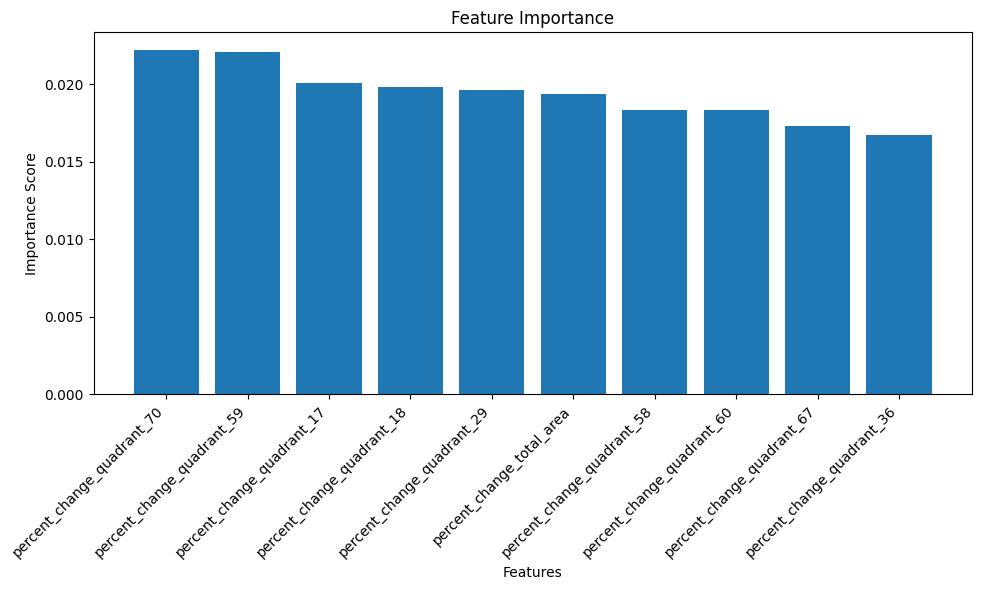

In [ ]:
feature_importance = pd.Series(rf_model.feature_importances_, index=X.columns).sort_values(ascending=False)
feature_importance = feature_importance.head(10)

plt.figure(figsize=(10, 6))
plt.bar(feature_importance.index, feature_importance.values)
plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.title('Feature Importance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
df_grouped = merged_final[features + ['Class']]
df_grouped = df_grouped.groupby('Class').mean().reset_index()


In [ ]:
df_grouped

,Class,percent_change_total_area,percent_change_quadrant_1,percent_change_quadrant_2,percent_change_quadrant_3,percent_change_quadrant_4,percent_change_quadrant_5,percent_change_quadrant_6,percent_change_quadrant_7,percent_change_quadrant_8,...,percent_change_quadrant_72,percent_change_quadrant_73,percent_change_quadrant_74,percent_change_quadrant_75,percent_change_quadrant_76,percent_change_quadrant_77,percent_change_quadrant_78,percent_change_quadrant_79,percent_change_quadrant_80,percent_change_quadrant_81
0,1,0.09954,0.06273,0.019955,0.008541,0.005378,0.011758,0.022684,0.082148,0.164313,...,0.405552,0.254323,0.504777,0.328632,0.133235,0.008298,0.017087,0.077165,0.112873,0.186981
1,2,0.091808,0.05117,0.007981,0.002994,0.007746,0.029158,0.047781,0.090125,0.154274,...,0.219229,0.189536,0.809293,0.254205,0.055739,0.011639,0.028169,0.069567,0.05041,0.240132
2,3,0.114257,0.027866,0.006883,0.001382,0.003431,0.02579,0.038498,0.06414,0.155139,...,3941605839.888145,0.257566,0.359936,0.139975,0.016439,0.004812,0.034575,0.043349,0.122494,0.276578
3,4,0.095782,0.020188,0.002889,0.001134,0.00243,0.009188,0.035701,0.093821,0.246333,...,0.223617,0.340635,0.22263,0.608576,0.423408,0.07372,0.073527,0.090344,0.099121,0.288645
4,5,0.087856,9029126213.68568,0.022008,0.004128,0.01161,0.040671,0.066728,0.133805,0.195604,...,6310679612.375384,0.164229,0.43195,0.195077,0.093808,0.033806,0.08016,0.092494,0.166443,0.319389
5,6,0.088014,0.049323,0.006682,0.00949,0.009428,0.012603,0.03133,0.063154,0.15387,...,0.315204,0.21414,0.39935,2.075619,0.211958,0.052599,0.086948,0.074295,0.07928,1.701486


In [ ]:
feature_importance.head()

percent_change_quadrant_70    0.022237
percent_change_quadrant_59    0.022087
percent_change_quadrant_17    0.020053
percent_change_quadrant_18    0.019833
percent_change_quadrant_29    0.019615
dtype: float64

In [ ]:
N = 25 # Adjust N as needed
top_feature_names = feature_importance.head(N).index.tolist()

print("Top Features:", top_feature_names)

Top Features: ['percent_change_quadrant_70', 'percent_change_quadrant_59', 'percent_change_quadrant_17', 'percent_change_quadrant_18', 'percent_change_quadrant_29', 'percent_change_total_area', 'percent_change_quadrant_58', 'percent_change_quadrant_60', 'percent_change_quadrant_67', 'percent_change_quadrant_36']


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score


# Define features (X) and target (y)
X = merged_final[top_feature_names]
y = merged_final['Class']


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest Classifier with optimized parameters
rf_model = RandomForestClassifier(
    max_depth=20,  # Limiting the depth of the trees
    max_features='sqrt',  # Using the square root of the number of features
    min_samples_leaf=2,  # Increasing the minimum number of samples per leaf
    min_samples_split=5,  # Increasing the minimum number of samples required to split
    n_estimators=100,  # Reducing the number of trees
    random_state=42,
    n_jobs=-1  # Utilizing all processors for training
)

# Train the model
rf_model.fit(X_train, y_train)

# Predict on the test data
y_pred = rf_model.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.810126582278481
Classification Report:
               precision    recall  f1-score   support

           1       0.95      0.67      0.78        27
           2       0.63      0.96      0.76        27
           3       0.87      0.93      0.90        28
           4       0.85      0.85      0.85        26
           5       0.93      0.57      0.70        23
           6       0.82      0.85      0.84        27

    accuracy                           0.81       158
   macro avg       0.84      0.80      0.80       158
weighted avg       0.84      0.81      0.81       158



In [ ]:
num_features = X.shape[1]
print(f"Number of features: {num_features}")

Number of features: 10


In [ ]:
#averaged_data = final_data.groupby(['video_name', 'Class', 'Name', 'MP treatment']).mean().reset_index()
